# Machine Learning
This is a long tutorial that will explore the basic applications of machine learning algorithms. The only part that is required to be turned in is the exercise section at the end. You do not need to understand the scientific background behind each algorithm or understand the nuance behind the python code. Instead, briefly look through each section. You are, of course, encouraged to look into the subject farther on your own but for this course, only a shallow understanding is expected/required to complete the activities.
<br></br>
The non-Extra Credit exercises can be (and probably should be) completed using mostly code that mirrors the code given within the tutorial. Use this tutorial as a reference for later analyses, but don't stress too hard about it.

# (1) Set Up

## First Things First
Imports

In [1]:
import numpy as np # support for arrays and vectorized operations
import pandas as pd # support for DataFrames and Seriess
import matplotlib.pyplot as plt # main graphing library

import warnings
warnings.filterwarnings('ignore')

## Getting Sample Data
sklearn, the machine learning package we will be using has a number of datasets within it to show different models or compare algorithms. If you did the extra credit exercise in the Intro_to_Python, you are already familiar with the iris dataset.

In [2]:
from sklearn import datasets

iris = datasets.load_iris()
wine = datasets.load_wine()
diabetes = datasets.load_diabetes()
breast_cancer = datasets.load_breast_cancer()

# (2) Preprocessing

It's important that we preprocess our data before we make machine learning techniques. We've already seen one type of preprocessing technique before, masking out NA values. Getting rid of NA values is essential as many ML algorithms can't handle them and will throw an error. 

There are two other types of preprocessing techniques which we will now go over:
1. Encoding - This means turning a categorical variable into a numeric veriable. ML algorithms can only work with numbers, and to allow it to understand qualitative variables, we convert them into numbers. The number itself doesn't matter. E.g. [Male, Female] could become [0, 1] or [1, 0] and the ML algorithm would treat them the same. Generally, the easiest way to do this is to just assign each of the possible values of the variable to a number sequentially.
<br></br>
2. Scaling - This means reshaping the data so that we remove the mean and scale the data to unit variance. What we end up with is a range of values preserve the relations between the original data points but is centered at 0.

Encoding may be a little easier to understand why it is necessary but to demonstrate why scaling is necessary, here is a short demo using dimensionality reduction techniques which we will explore late (separation of colors is the goal here).

## Scaling

Text(0.5, 1.0, 'Scaled Data')

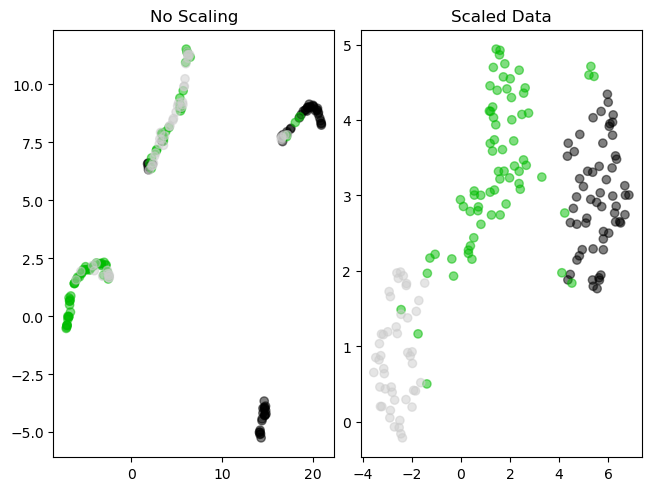

In [15]:
from sklearn.preprocessing import StandardScaler
from umap import UMAP
fix, axs = plt.subplots(1, 2, constrained_layout=True)

scaler = StandardScaler()

embedding_unscaled = UMAP().fit_transform(wine.data)

scaled_data = scaler.fit_transform(wine.data)
embedding_scaled = UMAP().fit_transform(scaled_data)

axs[0].scatter(embedding_unscaled[:, 0], embedding_unscaled[:, 1], c=wine.target, alpha=0.5, cmap='nipy_spectral')
axs[0].set_title('No Scaling')

axs[1].scatter(embedding_scaled[:, 0], embedding_scaled[:, 1], c=wine.target, alpha=0.5, cmap='nipy_spectral')
axs[1].set_title('Scaled Data')

## Encoding

In [7]:
from sklearn.preprocessing import OrdinalEncoder

random_categorical = pd.DataFrame(
    {
    'gender' : ['male', 'male', 'female', 'male', 'female'],
    'smoking_status' : ['yes', 'no', 'yes', 'yes', 'no'],
    'age' : [36, 24, 57, 24, 13]
    }
)

random_categorical # sample dataset with categorical data

,gender,smoking_status,age
0,male,yes,36
1,male,no,24
2,female,yes,57
3,male,yes,24
4,female,no,13


To encode (change from categorical to numerical) we use OrdinalEncoder(). Ensure that you are ONLY passing it the categorical columns (in this case, we DON'T want to pass it the age column

In [8]:
encoder = OrdinalEncoder()

encoded_columns = encoder.fit_transform(random_categorical.loc[:, ['gender', 'smoking_status']])
random_categorical.loc[:, ['gender', 'smoking_status']] = encoded_columns

random_categorical

,gender,smoking_status,age
0,1.0,1.0,36
1,1.0,0.0,24
2,0.0,1.0,57
3,1.0,1.0,24
4,0.0,0.0,13


To switch back from numerical to categorical, we use the inverse function. Your encoder must be the original encoder model you used to first encode it, or it will not be able to revert it back.

In [9]:
original_columns = encoder.inverse_transform(random_categorical.loc[:, ['gender', 'smoking_status']])
random_categorical.loc[:, ['gender', 'smoking_status']] = original_columns

random_categorical

,gender,smoking_status,age
0,male,yes,36
1,male,no,24
2,female,yes,57
3,male,yes,24
4,female,no,13


# (3) Supervised Learning

## Train-Test Split
With supervised learning, we start with labeled data, split a portion of it off (test set) and use the other portion (train set) to train our model. We can then validate our model by using it on the test set and seeing how well it does.
<br></br>
sklearn makes this easy for us by providing a function which will do exactly that.

In [3]:
from sklearn.model_selection import train_test_split

train_test_split takes three parameters
+ data - the data which will be split
+ target - the identified labels (must be numeric)
+ train_size - the percent which will be used to train versus test, commonly between 50/50 to 80/20, but the choice is ultimately up to you

In [11]:
iris.target # 0, 1, 2 correspond to Iris satosa, Iris versicolour, Iris virginica 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [45]:
print(iris.data)

[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]
 [5.4 3.7 1.5 0.2]
 [4.8 3.4 1.6 0.2]
 [4.8 3.  1.4 0.1]
 [4.3 3.  1.1 0.1]
 [5.8 4.  1.2 0.2]
 [5.7 4.4 1.5 0.4]
 [5.4 3.9 1.3 0.4]
 [5.1 3.5 1.4 0.3]
 [5.7 3.8 1.7 0.3]
 [5.1 3.8 1.5 0.3]
 [5.4 3.4 1.7 0.2]
 [5.1 3.7 1.5 0.4]
 [4.6 3.6 1.  0.2]
 [5.1 3.3 1.7 0.5]
 [4.8 3.4 1.9 0.2]
 [5.  3.  1.6 0.2]
 [5.  3.4 1.6 0.4]
 [5.2 3.5 1.5 0.2]
 [5.2 3.4 1.4 0.2]
 [4.7 3.2 1.6 0.2]
 [4.8 3.1 1.6 0.2]
 [5.4 3.4 1.5 0.4]
 [5.2 4.1 1.5 0.1]
 [5.5 4.2 1.4 0.2]
 [4.9 3.1 1.5 0.2]
 [5.  3.2 1.2 0.2]
 [5.5 3.5 1.3 0.2]
 [4.9 3.6 1.4 0.1]
 [4.4 3.  1.3 0.2]
 [5.1 3.4 1.5 0.2]
 [5.  3.5 1.3 0.3]
 [4.5 2.3 1.3 0.3]
 [4.4 3.2 1.3 0.2]
 [5.  3.5 1.6 0.6]
 [5.1 3.8 1.9 0.4]
 [4.8 3.  1.4 0.3]
 [5.1 3.8 1.6 0.2]
 [4.6 3.2 1.4 0.2]
 [5.3 3.7 1.5 0.2]
 [5.  3.3 1.4 0.2]
 [7.  3.2 4.7 1.4]
 [6.4 3.2 4.5 1.5]
 [6.9 3.1 4.

In [4]:
pd.DataFrame(iris.data, columns=iris.feature_names) # does not have to be in DF or have column names
# just in DF for ease of viewing

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


Note that X (capital) refers to the input dataframe and y (lowercase) refers to the labels, this notation is specific to supervised learning and should not be confused with the data x and y which we use for plotting.

train_test_split gives 4 outputs:
+ X_train - training data set
+ X_test - testing data set
+ y_train - training labels
+ y_test - testing labels

In [7]:
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, train_size=0.75)
print(X_train.shape) # dataset split by train size
print(X_test.shape) # dataset not included in above dataset
print(y_train.shape) # labels for corresponding X_train
print(y_test.shape) # labels for corresponding X_test

(112, 4)
(38, 4)
(112,)
(38,)


## Classification
There are many different classifier models. Here, we will explore Nearest Neighbors, one of the most widely used methods, as well as Decision Trees, Multilayer Perceptron, and Naive Bayes.
<br></br>
For more info, the sklearn website has a great implementation of visualizing different classifiers. https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html#sphx-glr-auto-examples-classification-plot-classifier-comparison-py
<br></br>
For a brief overview of each classifier:
+ **Nearest Neighbors** - Imagine we had a 2D dataset with an x axis and a y axis. For our training data, we would classify each point based on the its label. This is our model. For each point in the test set, we get the labels of the nearest points (from the training set) on our XY plane and classify it based on the labels of its neighbors. While a 2D plane is easy to visualize, Nearest Neighbors can be used in any number of dimensions/features.
<br></br>
+ **Decision Tree** - This classifier builds what is called a decision tree based on the data. Imagine a fork in the road with two possible routes to go, and then within each route is an additional fork each with their own additional forks and so on. Now instead of forks in the road, imagine a tree with different limbs that branch out the further you go from the trunk. The base of the tree is where the input goes in and based on the model, it winds up at the very end of a possible branch which is the output label. This is a good way to visualize how decision tree algorithms work.
<br></br>
+ **Multilayer Perceptron** - This is a neural network based classifier. A neural network with a predetermined number of intermediate layers is created based on the training data.
<br></br>
+ **Naive-Bayes** - This is algorithm based on the independence clause in Bayes' Theorem. Each feature (column/variable) is assumed to be independent of every other feature. A probabilistic model is then built around this to arrive at the most likely output for every given input.

In [5]:
from sklearn.neighbors import KNeighborsClassifier # default number of neighbors looked at is 5
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB

Basic Skeleton:

In [8]:
# Pre-Process Data First!!!
classifier = KNeighborsClassifier() # substitute with any classifier
classifier.fit(X_train, y_train) # trains model to training dataset, labels
y_pred = classifier.predict(X_test) # uses modelto predict labels of X_test

Doing this yields the array y_pred which is an array of numeric labels that the model has decided. You can compare this with y_test to see the accuracy.

In [9]:
sum(y_pred == y_test) / len(y_test) # percent correct

0.9736842105263158

Example using KNeighborsClassifier

In [13]:
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, train_size=0.8)

classifier = KNeighborsClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

accuracy = sum(y_pred == y_test) / len(y_test)

print(f'Using the KNeighborsClassifier, the model was able to accurately predict {accuracy * 100}% of the test set.')

Using the KNeighborsClassifier, the model was able to accurately predict 100.0% of the test set.


Demo code to show comparison of different classifiers on different datasets for different train-test splits.
+ Iris: 4 features, 3 targets, 150 samples
+ Wine: 13 features, 3 targets, 178 samples
+ Breast Cancer: 30 features, 2 targets, 569 samples

Text(0.5, 0.98, 'Comparison of Different Classifiers')

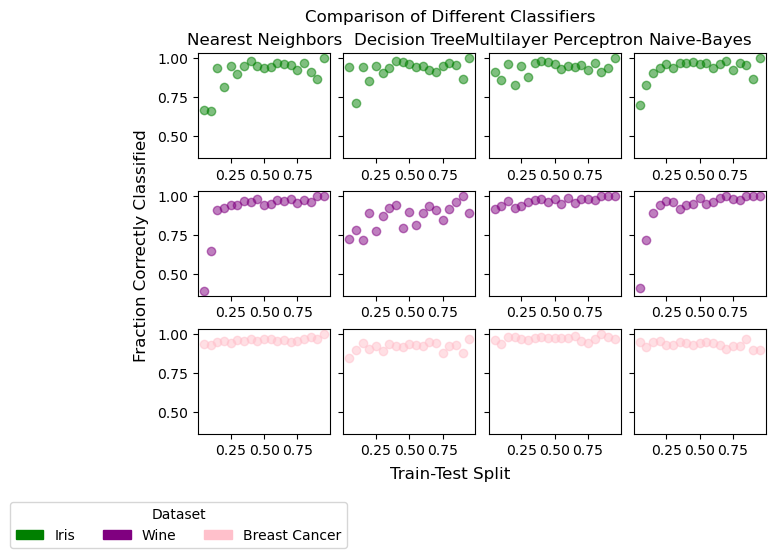

In [16]:
import matplotlib.patches as mpatches

scaler = StandardScaler()

test_datasets = [
    iris,
    wine,
    breast_cancer
]

classifiers = [
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    MLPClassifier(),
    GaussianNB()
]

classifiers_names = ['Nearest Neighbors', 'Decision Tree', 'Multilayer Perceptron', 'Naive-Bayes']
colors = ['green', 'purple', 'pink']

fig, axs = plt.subplots(3, 4, constrained_layout=True, sharey=True)
for ds in range(len(test_datasets)):
    data = scaler.fit_transform(test_datasets[ds].data)
    
    for split in np.arange(0.05, 1, 0.05):
        X_train, X_test, y_train, y_test = train_test_split(data, test_datasets[ds].target, train_size=split)
        
        for i in range(len(classifiers)):
            model = classifiers[i]
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            fraction_correct = sum(y_pred==y_test)/len(y_test)
            axs[ds][i].scatter(split, fraction_correct, color=colors[ds], alpha=0.5)    
    
for i in range(4):
    axs[0][i].set_title(classifiers_names[i])
    
iris_patch = mpatches.Patch(color='green', label='Iris')
wine_patch = mpatches.Patch(color='purple', label='Wine')
bc_patch = mpatches.Patch(color='pink', label='Breast Cancer')
    
fig.legend(
    handles=[iris_patch, wine_patch, bc_patch],
    title='Dataset',
    fancybox=True,
    ncol=3,
    bbox_to_anchor=[0.35,-0.02]
)

fig.supylabel('Fraction Correctly Classified')
fig.supxlabel('Train-Test Split')
fig.suptitle('Comparison of Different Classifiers')

## Regression

Regression is very much like classification however instead of starting with numeric data and ending with a categorical label, we start with numeric data and end with a numeric output.
<br></br>
We will be exploring Linear Regression, perhaps the simplest model, as well as Nearest Neighbors Regression, Stochastic Gradient Descent Regression, Support Vector Machine, and Bayesian Ridge Regression.
<br></br>
Due to the complex math behind each of these models, we will not go into details but the sklearn website is a great resource for further details.

In [17]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.linear_model import BayesianRidge

The code behind regression is the exact same as in classification (SEE ABOVE) except instead of y_pred being a collection of numerical labels, it will be a numerical quantitative output.

In [122]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(diabetes.data)

regressors_names = [
    'Linear', 
    'Nearest Neighbors', 
    'Stochastic Gradient Descent', 
    'Support Vector',
    'Bayesian Ridge'
]

regressors = [
    LinearRegression(),
    KNeighborsRegressor(),
    SGDRegressor(),
    SVR(),
    BayesianRidge()
]

regressors_perf = {
    0: [],
    1: [],
    2: [],
    3: [],
    4: []
}

for n in range(1000):
    X_train, X_test, y_train, y_test = train_test_split(scaled_data, diabetes.target, train_size=0.8)
    for i in range(len(regressors)):
        model = regressors[i]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        print(y_pred)
        print(y_test)
        difference = y_pred - y_test
        regressors_perf[i].append(abs(np.mean(difference)))
    if n % 50 == 0:
        print(f'Completed {n}/1000 simulations')
        
print('\nAfter 1000 simulations, the average error for each regressor is as follows:')
for i in regressors_perf:
    print(f'\t{regressors_names[i]} : {np.mean(regressors_perf[i])}')



[162.76835755  86.17948932 202.88099905 203.33242612 200.74344629
  77.3998106  160.26770225  74.56692444 177.83278779 291.56124444
 177.29159318  59.31914997 254.18091745 173.54951289 195.36455211
 168.2592982  219.14788732 218.74292862  97.68782866 205.68076201
  94.97776744  81.0843059  246.19896575  86.13276917 228.8567512
 172.41373486  99.53051167 234.35437948 138.90464642 210.31573696
 143.36276403 227.43413067 172.29442144 184.43180371 187.79307684
 179.34529428 259.48189803 254.30869453 143.17718338 174.42234608
 146.30019701 121.09546875 164.68475038 210.30809275  52.88108212
 167.90098043 157.091821   165.58037411 110.95080582 197.84560869
 180.10849291 157.34057322 195.67272406 182.2223128  252.28911746
 137.82726504 118.92007483 128.48383097 121.50281594  63.96722522
 137.77320876 241.05393078 257.60652346  68.45419925 132.29949696
 115.0292481   76.70461049 150.80906327 190.51975671 265.56390586
 148.48436447 167.7977635  223.42637271 155.86083588 174.14190245
 119.721014

[154.04530325 186.81197137 178.85195011 184.61577465 126.12425691
 111.5659273  141.80654926  75.52185353 225.91521656 196.21133052
 106.13855236 139.23510512 207.23296786 180.80350092 101.11690901
 250.26599239  50.74091224  85.5765376   95.77725232 251.96852861
 125.15327471 142.60124451  98.71285544  61.59259111 122.53832062
  88.32074261 199.50010929 163.30013743 114.49532958  50.71363763
  56.48952785  85.29030743 116.48444687 156.84626021 296.97192283
  74.17036592 196.67672711 126.85039699 163.92815809 152.2277385
 181.02824649 149.11728871 117.73411261  69.09201235 141.50823011
 194.08063648  84.8827688  174.76644936 129.41916366 149.80748014
 113.34413866 144.86116187 274.37306097 162.67239475 166.22920266
 249.61316888 160.02682507  48.80120296 249.85842558 101.19335837
 269.4094249   64.67354153 115.55794676  96.6050406  136.14134835
 256.21438385  60.49481488  74.15855927  78.89393127 161.97737675
 117.06720984 167.38378067  90.27725317 205.17147334 135.37533529
  55.660537

[163.8  86.  121.  228.  218.2 159.6 122.4 235.4 186.8 200.2  97.4 141.
  74.6  87.8 125.8 197.2 161.4 188.2 264.2 279.2 195.6  80.6  94.6  80.
 152.6  87.8 194.4 132.   88.4 221.4  64.8 114.   84.4  91.8 109.8  92.8
  87.2  82.  144.2 191.8 154.6  84.2 153.4 139.2 184.2  78.2 140.  219.6
 216.4 182.2 118.4  90.  118.6 246.6 132.8 179.4 125.4  98.8  73.6 164.2
 213.4  74.4  91.8 147.  120.  164.  258.2 144.8  91.2 210.8 115.4 128.2
 158.6 269.4 185.   81.4  97.8 117.2 177.8 227.4 165.4 168.4 150.4 277.4
 190.   91.8 139.2 123.2 149.2]
[275.  63. 172. 248. 233. 137. 178. 259. 178. 306.  60. 257. 200.  71.
 219.  84.  69. 191. 281. 295. 170.  42. 101.  60. 103.  83. 208.  64.
  42. 217.  52.  49.  93. 262. 162. 102.  57.  92. 196. 121.  91.  48.
 167.  84. 212.  78. 163. 220. 109. 233. 103.  53.  51. 202. 139. 311.
 146.  72.  65.  25. 217.  71.  87. 277. 172. 202. 280. 242.  94. 288.
  97.  49. 190. 341. 118.  53.  90. 156. 198. 268. 185. 131. 127. 308.
 124. 191. 141.  72. 128.]
[250.0

[ 93.77579881 251.51198419  93.17852714  79.41989138  96.9168644
 182.57631454 201.59773983  89.58367164 164.38184129 177.61834999
 103.21010274 187.66694745 167.55683292 105.11018169 114.6241854
 193.49641835  89.7691341  176.40702845  86.91050576 108.61413676
 106.16133119 156.10224966 209.41650496 188.8388036  172.20801609
 140.96112461 111.64966646 165.06897632 194.99248532 114.47972494
 190.0471853   72.39916029 159.73033497 256.00792277 216.21222993
 152.53953361 143.05535019 161.84950474 121.8702783  155.52162873
 188.99036497 102.54516141 147.70015198 222.34652264 123.1411886
  86.19481726 129.06906879 197.58636414 141.57611069 262.48823596
  98.72411012 145.10733292 105.32015029 134.96440111  96.34879372
 251.82494829 121.26816381 140.1538236  174.97625729 127.99635512
 241.77804058 173.04088914 165.05333729 210.97770437  76.63227495
 163.43619064 162.91709875 199.8577549  141.12515872 225.03330486
 104.74023783 184.41171664  75.57927852 181.50024092 189.59986612
 154.96655668

[156.33398534 143.34941156 131.80415681 141.06564217 128.82493897
 141.27166243 141.82811604 143.49805873 158.54511919 119.16931442
 146.9942255  152.42318936 139.33313122 121.54187677 133.66813644
 125.08503615 136.33121874 134.68490135 144.80353318 117.05016287
 157.28066384 151.48606552 146.50623814 142.92196819 146.41248079
 150.37183161 156.03090176 141.76584004 142.39402687 141.5334152
 147.77348141 126.05103628 129.05108004 128.7495667  156.13394623
 147.95004448 153.55316664 136.6471676  144.30870267 152.51910946
 153.18791945 148.06527915 143.53438583 123.05883499 138.66339673
 157.67384799 154.89886336 142.11087696 145.00659815 141.31610778
 141.05559145 118.84879185 133.41981688 144.99638153 131.28927072
 157.64087329 158.14171305 152.10865232 125.68280496 127.47337536
 130.46178752 120.88020247 143.1533742  141.90193607 146.86465276
 159.69424908 143.34195663 122.37249632 163.47046334 132.88667354
 130.49266478 126.94259068 148.66819314 127.18769694 145.26669537
 131.352614

[ 91.6 142.  254.  205.6  61.6  99.2  91.6  89.   91.   91.6 119.8 184.4
 142.8  99.4 106.8 145.4 176.6 116.2 131.2  80.8 218.6 118.2  90.2  94.
  58.8 145.8 198.8  82.6 281.8 173.4 146.4 165.8 121.2  92.6 216.8 223.6
 179.2  69.6  97.2 106.6 240.4  94.8 195.  110.6 266.4 143.  259.4 123.4
 132.6 125.4 170.   97.4  98.  147.6  83.8 144.8 158.4 115.   70.4 144.6
 245.2 184.4 164.  217.   84.4 159.8  82.4 120.6  71.6 221.4 186.8 232.2
 223.6 266.8 182.2 164.4 142.  218.4 240.8 119.4 274.8  96.2 139.6  98.2
 192.  240.6 194.  152.8 202.6]
[ 55.  55. 277. 346. 181.  47.  71.  72.  42.  43.  61. 129. 220.  90.
  87. 249. 185. 152. 221. 102. 150. 219. 182. 155.  77. 142. 270.  74.
 310.  66. 110. 121. 262.  37. 296. 166.  59.  52. 101.  72. 248. 135.
 217.  51. 268.  84. 281.  64. 161. 109. 171.  70. 118.  96.  71. 242.
 113.  85.  42. 144. 195. 232. 202. 181.  74.  52.  55.  96.  53. 237.
  81. 163. 186.  99. 233. 248.  63. 281. 265. 200. 341. 104. 177.  63.
  48. 109. 189. 140. 215.]
[ 58.

[119.09706318 136.46617133 149.14948109 129.00337979 125.89076492
 133.5275339  122.87032966 149.77963245 125.18572468 143.30953653
 128.72011825 155.16624843 152.24573091 160.86710557 131.71506117
 143.17457796 132.64605034 119.05795601 129.10753163 132.64291936
 135.73206731 152.38473581 149.15279077 125.0846661  133.10139626
 141.78118366 151.43150793 153.35949226 160.74481367 115.1132052
 122.83494508 156.77059753 147.04335597 123.74483878 159.19724819
 151.48159589 146.22739018 120.6580572  132.94308591 119.23832382
 122.4640112  150.93764346 143.14818175 147.74376419 148.8266365
 142.76976794 137.81041545 115.77039964 127.0258291  143.12466038
 154.22224472 139.19258591 148.29726139 121.07846228 155.15019325
 146.62103742 122.83705794 141.91937353 123.50153399 123.2496881
 146.74705091 152.96565939 142.06165148 115.57895563 130.03243119
 125.79797707 150.53290056 136.63275965 124.03468784 142.09164508
 154.36712284 145.63495926 145.28355053 153.9175481  129.77842349
 133.95360682

[122.20481009 129.58937957 129.27279147 152.71121045 158.54897793
 163.38892152 124.9435114  129.12009474 139.29164353 118.26249139
 154.36569576 144.83033604 125.01248724 145.16685622 123.08392151
 139.36250647 157.62950594 147.18611263 120.3196258  133.02929372
 162.82009592 139.45594634 129.91333875 139.31408511 131.90668968
 134.51297006 152.52425311 150.47091607 131.57426222 125.70333908
 139.26499685 126.50229244 124.92903661 114.03980287 146.32821455
 124.45172433 154.10321743 145.60206913 158.17518226 130.06855696
 132.67615093 122.86063164 120.65569571 118.96898831 118.0081685
 164.11256809 138.07794535 120.46315125 147.93406419 152.37388778
 150.10871231 130.47549824 156.31215844 152.13811178 125.05556112
 156.98714317 154.61788799 117.96678341 127.82700739 130.80024306
 122.78536826 129.99296066 122.2400188  132.29940104 121.79134333
 158.45507002 153.19040083 157.54700931 140.64439037 151.06000305
 148.3081681  157.02292731 141.11208217 117.52700951 142.84907121
 124.727824

[148.68487676 152.84830498 147.12683098 124.38514973 126.60484368
 154.65257815 146.99631872 153.37690671 132.348918   157.17543721
 152.1479315  117.53044775 149.11571896 144.12829448 143.31139676
 117.94789706 130.08165154 142.19059317 163.29282997 130.86040202
 148.85464454 156.99093948 119.59561816 156.44196396 122.71758641
 141.3514665  151.78648104 130.72954853 136.58414314 131.39052426
 124.48160091 153.9812085  128.81479693 152.41330964 142.88634778
 153.05314078 134.10722452 144.04826833 125.81481276 146.4897755
 155.45948809 121.86980757 143.01217696 123.36122004 130.72047371
 153.77648113 150.80248654 145.61604536 129.13748693 125.581714
 163.88123623 157.72611798 142.41850988 147.75168358 121.50399336
 133.82923109 147.00471593 152.07236155 147.44547575 147.13163169
 158.8404289  138.19427541 117.09170313 139.40503782 145.57937575
 161.13200369 122.65630193 151.149703   132.8763472  124.98064859
 157.58630104 143.0639352  120.11657973 128.34024399 143.73884734
 122.73588138

[129.692703   153.43457719 153.84003711 117.03676762 127.81124527
 155.00119395 149.34524759 118.12184207 125.74868576 128.25799957
 152.73215196 122.67778542 131.50148081 133.68600512 143.14267041
 136.73315917 114.26530731 128.22128997 144.56990755 148.47094838
 134.89122615 121.20116626 121.86721749 159.11092754 133.0770876
 146.47940562 129.24458686 141.85233137 160.52888422 145.93506455
 137.33355639 155.77818447 143.62020003 158.13898707 144.5279894
 153.69736675 137.38041945 149.58606116 128.545565   141.46449194
 124.36457151 135.17749017 118.6464639  155.67918834 142.41408503
 151.54707066 125.05117342 122.01874925 159.08689167 121.33379266
 115.28742765 163.07168176 123.10049641 126.83736069 115.36579441
 129.03655773 131.88398384 131.18238077 134.55069598 143.91876315
 120.9463024  148.22782255 154.63275444 146.87724016 127.21638362
 150.38124633 149.15055906 148.43626558 130.83385216 161.90120507
 124.8746995  157.57559122 116.04736997 142.6842607  155.68469202
 149.2067350

[187.  202.2 105.4 143.2 130.  142.4 143.6 149.4 173.4  72.2 243.6 279.
  90.8 193.8 165.2 164.4 190.  117.2 146.4 124.4 102.  178.2 230.8 233.
 133.2 184.6  97.6 115.4 147.6  78.6  91.2 175.8  80.8  85.2 149.4 102.8
 141.6  75.8 258.8 111.  227.8 198.2 206.6 122.2  87.4 233.  274.4 125.4
 153.4 141.  156.6 118.   86.  161.  133.2 187.  171.4 191.8 148.2 162.
  80.8 109.  159.6 220.6 242.8  91.4  85.6 260.8 126.4 175.  152.2 117.4
 153.2  77.  123.4 186.8 163.6 146.2  47.8  90.8 236.   85.4 150.4 134.4
 122.8 184.4 114.6 193.8 161.2]
[220. 225.  53.  55. 219. 109.  84.  95. 144.  71. 242. 310.  74. 275.
 263. 206. 124. 127.  25. 134.  89. 272. 261. 281. 168. 150.  53. 221.
 210. 191.  94. 151.  87. 182. 103.  47.  68.  43. 274.  42. 120.  90.
 174. 154.  42. 308. 264. 252. 190.  73. 174. 115.  83.  91.  55.  48.
 229. 259. 293. 170.  85. 214. 129. 189. 242. 118.  96. 259. 113. 220.
 142. 144.  85. 138.  72.  81. 283. 230.  52. 114. 277. 160. 122. 183.
  93. 202.  80. 258. 246.]
[164.46

[204.56779135 248.45867037 171.62960542  71.61932336 141.56447013
 156.75046267 239.62386623 227.35399576  69.44833263  64.67084046
 148.68804247 119.72564273 158.12872407 171.95221264 138.79591793
 137.0677347  163.59209486  58.02491007 248.68835323  91.75407979
 190.24223533 176.03258625 225.32151017 146.82213584  64.66124535
 189.61409151 169.5366558  192.64814666 267.57432783 133.27045506
 237.67488645 180.74763989 174.9739885  166.77357769  94.76779035
  81.48774394 100.58816451 120.40423444  88.78609663 175.01156214
 210.87753918 299.91879069 110.30530132 157.7871504   71.54891871
 184.83213255 101.54768785 125.75219316 121.38915161  96.31749144
 192.67547386 167.08470252 219.12350719 248.18762394 138.74383336
 103.26722117 198.90926396  94.43692742 145.08167375 139.26990125
 207.51878642  48.80563304  81.97453027 200.78368891 101.0811521
 123.19788178 165.49838401 112.57769599 188.45766694 194.01728669
 180.15142986  94.88366572 140.72205769 114.72626301 148.31264583
 177.952508

[149.84189359 126.45736758 150.45131684 136.71691035 155.13063904
 116.92994057 118.24980217 131.06017659 132.69184512 129.20201918
 114.70131727 134.33077485 164.19649326 149.23735393 162.96356708
 129.5341587  120.75781294 145.53987577 150.45059745 144.09874445
 150.84148921 138.3519336  155.97980393 153.924175   120.93285083
 132.19075621 137.63540486 133.28166799 119.03616615 143.1488011
 119.57094342 143.18792372 115.89439398 128.64574007 139.12547504
 135.52796968 145.8880175  130.46776345 147.63696396 134.12663752
 133.09780917 133.1033783  143.05728029 153.58447943 152.1415529
 154.77206676 153.64491686 114.6705927  152.70419546 122.95999843
 148.70522151 128.41878815 152.56764761 120.79467355 133.33001311
 153.68516959 149.95524011 120.40300552 147.33702401 135.66071375
 123.88143228 159.66891251 145.46018496 120.96677589 119.28913136
 154.82275875 156.81346488 139.58328412 121.80182837 129.91380885
 134.5779415  134.77960105 119.05569002 128.46204418 132.51765568
 124.6763544

[144.22408223 114.08874047  97.06714756 163.80824417 105.49730248
 162.34965635 182.43336312 134.70762706 150.31768626 131.35063094
 113.97483885 221.72475049 105.40131655  84.07065803  94.96388609
 121.30356663 208.99878667 255.92088304 190.65266955  69.48550543
 148.47122564  75.98928047 130.29663309 186.51580553  61.46882244
 210.29226355 167.22557365 204.1391365  121.87115577 232.22576493
 101.40794849 117.30269957 126.14384196 146.35263291 175.58661766
  96.93845914 144.32298388  62.22100619 122.26737198 231.14771879
 117.51530588 211.05009192 125.47847421 104.2753914  177.47777483
 100.84984663 102.51733381  86.85325534 103.80331523 181.75567352
 104.51233927 122.44992131 115.49905862 165.92774802 106.70504972
 242.87719407 209.4577477  228.82097495 145.39209565 207.70244979
 135.7790395  163.8865237  206.09685954 177.8031666  118.57057422
  77.05199979 117.91955101 110.62480334 105.27730259 141.47181592
 220.74884044 152.39191862  81.39077097 124.5680572  173.93713604
  72.08937

[123.68520635 125.43990468 155.7753399  151.06800129 129.86627231
 136.46456105 151.93214405 156.81006199 130.11252968 142.73733928
 142.55572481 119.11030609 114.76041881 157.28431221 141.09163299
 133.69969004 135.20697105 142.17792154 131.73033942 133.58984356
 130.49665821 147.02787556 124.09817417 129.71401009 159.28184985
 129.47584663 137.67097497 160.05156899 153.32124892 144.05351293
 119.22694131 153.77030216 122.17570261 120.4707891  132.87092759
 141.71927541 145.61202383 154.4645362  160.68650633 127.34075108
 143.1985506  145.60101535 156.62511642 129.01193128 141.83034784
 145.21505613 133.02012285 149.83243706 133.00399588 123.4541723
 126.60049454 160.33301876 130.48397225 142.33642401 147.31729413
 124.45095989 121.07951132 146.57888898 129.07386405 145.25995446
 159.05210768 154.91340768 151.10743385 123.91028316 143.35638863
 159.60147051 128.56947604 152.03031494 128.92274748 149.81968715
 134.22575786 116.5378965  124.10159781 136.41072981 121.90353702
 122.632342

[222.94828265 106.35630828 247.27044881 259.76139144 275.49358892
 115.82002816 141.28326449  61.53479672 213.97897645 117.8290172
 151.90986606 171.14087222 150.61168725 168.21933352 111.80739051
 108.05634995 142.31177583 152.88905615 156.21312049 155.65222251
 191.50911537  74.35187681 213.00398771 114.70162728  96.73194073
 185.21782509 202.5087375  182.44659871  73.90810522 179.41985353
 123.3872408  159.41102744 191.92280085  53.16200791 150.3796634
 108.06371963 161.96916932 171.71888529 196.83468457 213.83417092
 191.51849327 160.54607931 230.85810499 184.53138911  65.45264512
 143.31186613 104.09814259  63.84469009  80.7607578   66.63209498
 162.00869306 112.16858146 203.89236359 150.51125039 117.95432769
 226.15603079 160.473884   297.55095837 133.24010982  83.92951798
 113.79479868  77.91330108  84.56693107 121.3988142  158.70904076
 216.49931035 186.46306791 114.51720311  82.45711326 177.68456378
 163.62744885 141.82215844  64.61763825 183.42705951 103.56410458
 198.4252606

[186.1384602  102.5802973  143.47202296 131.51453475 160.70027264
 150.50334837 193.35009659 141.06408073 164.73188903 126.17403224
 151.60864715  70.73141356  56.71006586 181.50174541 183.33532096
 104.48510489 121.54772956 179.85330506 151.37825906  89.85083946
 222.34415312  65.22618369 259.79661088 212.03197181 207.93454302
  58.85674909 116.96340761 204.05224974 254.81352747 296.08013756
 173.18718481 168.42903227 120.60876527 187.40716956 114.31301662
 208.76205225  70.62138121 202.9377495  184.84535692 101.52518943
 187.43530639 106.6449668  232.37543728 132.9296513  114.27016698
 185.85231048 163.07758328 232.10221331 137.4291088   73.90194184
 127.87746232 293.12676042 138.19425753 139.98910977  63.25899802
 151.22525404 237.36311654 174.34914929 163.0167218  223.32903171
 261.88575803 184.05780023  45.80876679 163.06449519 183.15377281
 162.20997777  65.83762754  76.96728759 126.67098508 153.13813079
 125.75656474 155.30165481 194.38242211 187.75501966 144.20916654
  85.51186

[ 88.93517422 115.80060322 177.84229821 223.18242398 116.75498638
 147.0843114   56.94704088 176.20290259 222.6015615  137.72173584
 200.47803495 156.86590882 159.55367646 174.17476371 112.10280934
 105.62005975  75.84974064 163.75402292 159.2079253  134.23610497
 187.1488838   59.83944662 245.77521243 206.79573017 142.79698316
 146.08300509  68.85741379 141.24356102 122.79918442 187.04262045
  89.13542933 140.5645894   76.44992958 170.51280888  99.00124966
  64.99652063 102.01383827 124.93216139 249.58452457 218.87496752
 189.63379425 125.90752033 168.11991801 155.17380753 135.67499022
 268.51136998  70.74752827 167.29374614  91.68350999 175.0180528
 131.56211734 105.1925694  176.16069858 236.56672667 180.55336452
 160.4661032  180.48670612  88.52311832 209.75747704 123.01158196
 147.82449307 126.00502626 174.58741195 111.32532792 144.48051415
 100.19916065 142.40484221  59.41352377 138.88865295 127.78356292
 182.42756904  62.87369251 234.59738918  46.87582099 102.27260411
 147.107368

[141.93207346 109.32510055 217.38420157  82.56732248 230.2659374
 126.56639312 113.9063115  107.44484986 197.62883527 236.44880609
 156.89084035 141.76053703  74.50539161 191.4819712  242.03139134
 128.62638109 166.67969591 242.23542179  95.37120753 186.10868822
 170.15664198 167.56860394 149.03359185 137.34493682 155.91908049
  72.0461151  177.33209106 182.69608365 237.40972104 108.30803364
 220.34012026 156.57506414 238.63478429 236.96566089 154.62348223
  73.32610415  55.57440949  95.75723266 188.35798833 107.98201788
 160.08418924 224.17073867 125.17659014 119.39306041 106.16529607
 234.92359283 160.92867203 210.73863266 211.47374269 195.48063419
 247.64401377 189.24893323  30.12842989 211.64351933 165.7703926
 250.1668021  112.35011886 180.71122544  80.85416115 174.18648154
 164.2792094  120.63447899 165.40194285 100.04981733  76.76015458
 129.68575702  76.42819117  91.58070405 177.89840377 154.76728022
 206.74308929 160.73065907 132.24176398  50.08558049  72.61655604
  68.2133899

[184.47143707  98.56997304 247.0995988  185.46577849 186.94443588
 114.66362595  65.99482186 115.7995667  135.91124454  77.63465429
 209.37500073 159.53059626 155.88350185 146.76279499 165.52407017
 170.31796521 217.84570241 201.96169962  80.48614425 105.05671941
 197.02925673 176.29954455 118.18174527  92.03696401 161.69061999
 116.64799083 229.28482235 175.31731024 183.21916256 188.97898027
 227.27988864 116.3016601  191.05978463 167.12976526 164.5168098
 141.33446779 188.05694438 127.56726577 159.0223846  219.40073032
 117.7884966  123.65696069 170.07728598 121.30155017 104.37959157
 260.27405355 175.46467772 128.56727854 187.29229565 250.31158084
 109.24996132 259.57158043 116.41240619 162.56343225 160.40696646
  95.6119538  178.14957875 141.78641712 133.70719566 104.44117928
 169.85311458  90.30103837  70.36879662 224.2861379  103.11400249
 139.56209485 135.41225543  97.793362   234.62845443  82.70856291
 120.20259663  59.22459155 122.02458432 121.73572391 222.6107682
 159.2068661

[137.14747788 124.68117509 147.77889386 133.809875   155.45374264
 138.90398277 131.01242702 147.26080938 128.60977365 134.05668759
 146.34478196 145.952658   156.04459611 123.1926981  156.01171814
 150.6227757  134.50296568 153.21248538 124.35571824 134.54066922
 155.57502922 131.34050559 136.7235522  131.98668774 146.65496909
 140.91671239 154.75361431 152.27600223 133.66453751 132.04953202
 156.95916664 157.99948771 122.02214366 150.41385321 149.84293947
 141.72333566 149.15450062 143.90637143 127.59422843 130.21925193
 140.30273215 126.34940856 124.88633502 149.47615756 141.07353516
 139.29930798 151.55853847 117.66981816 131.21018148 159.63731115
 157.97509076 163.33740119 134.01661452 157.92998972 143.57061841
 145.55341561 167.04590065 126.18505353 130.27491161 150.33905124
 135.41706423 158.46097385 121.41386775 143.03454888 160.59709928
 134.63885377 126.99576719 156.4440974  154.10240803 155.25785085
 127.00729122 130.66072367 151.01717222 160.08377372 133.69814689
 117.66873

[120.22858425 149.79646988 144.74803641 147.78300484 143.15573078
 118.06923675 150.97255186 139.80166342 129.4316315  122.7992255
 153.94058567 127.56700379 120.56958827 119.74626498 151.99151425
 118.86765794 149.08851024 122.11154149 146.48643205 151.67962463
 131.96256854 144.1899534  137.48715582 123.72066225 155.67919388
 153.25423093 150.57415023 157.45832017 143.48116864 122.55949979
 125.16778122 139.33000152 149.0488599  124.85955391 152.98496345
 132.43539679 153.40850955 138.15874421 141.34684413 130.1850036
 148.84739131 124.26535358 115.08988419 123.10086759 145.20866168
 146.36893941 125.68214898 147.83452232 154.42336085 130.56837568
 151.79398787 132.75828989 149.63406497 140.49261399 124.5190969
 117.40246645 147.17373455 144.56706836 148.28582699 127.27029176
 143.25475276 159.12503494 122.04677041 150.28268386 132.09077901
 156.33471923 129.53622523 137.29564383 157.95512255 151.56264933
 121.88502723 130.68852419 125.83451161 146.72893605 115.96724421
 141.6406077 

[153.93612425 151.91427538 155.60642404 152.0458257  129.64775526
 151.6929832  126.65238298 145.43369567 155.54971034 153.43557574
 117.36138206 160.13390011 129.12311535 125.18183713 137.18265056
 121.15358738 128.4881856  129.94507001 149.3687147  118.76555169
 137.89705239 133.60393784 142.1959815  161.69187676 120.39309046
 122.75908888 146.45224753 153.97984086 127.66165717 127.33696538
 131.50015074 131.84522934 129.99217586 122.92021329 152.85052617
 153.01360692 125.42686977 137.89551543 156.62783047 124.41621657
 134.72992584 150.2307728  139.04683773 157.77805138 128.91666612
 146.13751565 120.39661756 144.54098468 133.05439608 150.33269184
 121.73424389 143.09338638 118.46798866 134.57998456 150.86984741
 155.20252381 133.42771636 149.06799116 145.05493112 137.17816807
 151.74438934 151.17692684 141.64974128 132.96877897 135.04879536
 138.83357591 124.81663203 145.92729734 120.51922267 151.96585661
 145.97760978 138.49717826 133.67488823 137.6528173  118.59115846
 145.26014

[158.40221898 144.0398285  121.54002333 131.36673144 135.10749765
 141.17687288 142.23672604 143.63014543 123.15990203 141.20834996
 134.62996303 147.51297966 124.99174855 152.19282195 156.19412337
 140.8200984  145.25100974 129.6908614  125.98028346 135.47868912
 141.83152808 127.08583442 136.32974398 139.998397   120.87495025
 144.39334071 144.52625441 153.78931759 151.83085159 153.74205707
 123.40813688 123.10260807 144.77772295 158.19030624 154.00703635
 126.76280892 148.71337327 124.22645779 155.78468103 125.52135337
 120.54153057 147.24732935 139.95098723 145.42464191 152.06692761
 154.36483626 118.72342903 125.80587189 147.71968746 153.83925932
 137.33036987 120.87344747 157.25211811 138.93723427 125.42271554
 121.43430056 119.8716487  133.28597529 140.98355522 140.70095867
 118.54762741 121.62359668 131.77667314 127.59885403 134.63485443
 144.52202844 131.45156858 131.29580913 129.78565368 118.4767517
 125.12542384 149.68914016 132.28854137 151.77971703 154.33223885
 153.753055

[119.67213106 150.92748661 127.14387098 133.14151871 134.4654491
 147.15754179 135.88490893 140.83707094 142.38067946 148.79544464
 150.1814398  124.46399583 146.93781605 122.69081881 136.87718004
 126.26374019 125.20012263 149.19082536 128.59583696 151.92003414
 129.29722102 126.1855688  157.43725208 132.89581702 131.42946844
 151.73287326 147.35912583 122.10107258 150.15977196 150.15213022
 129.5616557  140.90879612 118.22784806 149.04125142 146.52995285
 141.02425635 132.80775079 117.50075836 156.57281896 154.96269522
 159.69066841 144.98461548 140.06550337 148.39902788 126.5121785
 121.42762661 134.73935938 152.30467978 149.50770292 156.83678241
 153.23799914 137.44122762 152.1312291  134.42712638 144.96287617
 146.22223893 148.35987828 133.01583522 130.12716254 122.55260918
 144.9953662  138.45418159 119.13889134 137.18057165 121.48126349
 157.67919162 127.24800768 127.05219988 128.50857223 131.57803343
 151.50584621 122.86756979 153.17940263 124.0186108  121.8897212
 154.3537471 

[176.20172392 184.24514856 202.67889955 120.72163185 204.82639849
  65.93784444 216.49732525  77.8670932  209.01117823 214.43489623
 231.46719779 219.68450624 149.19015169  78.85688313 200.98289291
 112.87482409  58.69110727 116.43444108 224.88316047 195.46899063
 184.90464283 195.68820634 137.05995918  90.40036815 171.02870453
 138.71944942 104.56787966 125.80815738  84.83818693 127.89727761
  84.65104863 105.92401054 138.59240701 143.85761693  72.31612663
 257.40841916 255.23586798 186.23284475  64.83772286 172.83049714
  74.7240769   71.75123833 174.2761646  122.51645197 140.63966132
 111.70439068 125.85180493  86.7456591   63.11365142 196.01638322
 181.20225058 148.93757877 228.61508161 155.80714805 172.03174834
 103.70951629 185.3572661  118.80471931 157.02462563 178.76785862
  99.39262332 152.89586277  86.10128141 153.35986189  91.10344472
  61.86848109 265.03305475 194.41174152 127.44914308 110.51223942
 238.56158985 105.31183812 255.10478253  98.97813583 140.71209853
 244.34948

[134.2914826  127.47605083 121.71213071 127.99556427 145.39628952
 123.94383497 116.56865976 155.04570847 132.30312232 147.87859558
 157.32737916 150.54358681 144.47123122 146.35413359 152.33197602
 151.73581387 122.83125766 126.92813151 145.01287838 122.9225591
 153.33949427 143.80731312 127.1581593  145.80481125 155.18989004
 141.80374259 132.22336428 140.56327171 143.50376442 137.71566396
 151.90385273 122.12248078 157.47331719 123.6668363  140.63686662
 117.57560171 124.47743755 134.6493912  150.50402935 142.51242936
 135.17057409 141.96824695 117.76206613 155.89541619 124.2033898
 134.39877629 124.65903561 143.73294528 143.98667566 149.90466431
 126.14776048 154.4733623  148.10340035 118.35090237 154.09205353
 162.63637142 138.63744278 122.41712067 161.191406   131.28651431
 128.5688969  155.68940404 155.40777578 161.52171529 128.76512534
 146.78526287 123.88163798 142.2223515  158.17476492 151.23209778
 128.04823405 147.13115915 147.40035976 155.50404489 122.1665459
 139.81472259

[134.87684589 123.46748489 156.54407622 139.22063196 125.72586809
 144.02875959 125.317067   122.46125054 148.55253641 165.60526682
 122.81021121 143.37241665 158.21668864 145.76583342 140.96252297
 136.36596455 139.17712188 126.47126002 146.46323882 121.70418751
 147.34922919 136.52024114 126.1730482  125.25997758 155.82749766
 157.01381395 134.81596627 162.00901636 165.24717109 161.73066153
 148.85579706 140.82315601 131.82991642 162.12134138 151.73976977
 144.5939837  146.63255932 153.47598587 134.9785816  133.67954147
 140.04797539 166.61747203 158.57450516 125.38361592 132.93420762
 117.6808666  126.70819337 159.50937634 130.66264869 156.95770347
 130.78650759 151.30005259 117.4465498  146.92430011 139.21547593
 153.56704487 146.42892669 159.18804146 145.98297442 124.63967142
 128.50081772 133.26746735 146.76568549 119.99052522 134.86574718
 146.9487339  153.33741066 126.98069201 148.88729425 148.27504948
 153.37089003 137.1744583  150.91521463 158.87119531 134.04140403
 156.14044

[114.55784823 130.97341233 132.97991498 137.50285202 136.36488548
 138.50300433 139.54831294 123.40709264 136.0427848  135.29790584
 138.40192036 143.09367855 155.16086801 121.66728698 141.32741845
 142.9289735  156.2201595  141.26624531 144.58943719 150.14339978
 144.16735332 134.2167235  138.68521776 118.6801698  137.52209688
 149.37469888 151.39464033 132.66810913 148.55478945 141.03587112
 152.37267854 131.68423513 145.59531123 121.18723933 119.84769433
 122.1993645  151.98182861 128.82001271 119.68510844 151.8846957
 153.64805616 156.40099839 159.53777349 127.77962021 124.00477299
 133.17204751 120.34185388 127.33823766 130.12460248 153.88606888
 128.52660584 133.36578842 133.42753409 139.02077649 149.32591649
 118.19614985 140.67466526 124.71778341 150.62166842 133.21505781
 156.76693423 135.96382932 127.15044072 137.51558931 131.41045358
 139.45392686 119.2569942  123.5777711  122.90103903 147.60650199
 147.56541707 155.16956884 116.02792169 118.05823236 155.80149884
 148.459742

[121.45765912 123.34389837 125.5200972  155.99974378 124.81049027
 116.15845589 130.4694453  148.73890694 124.28131713 151.75388468
 126.71517989 124.05049664 143.10017575 156.83046192 155.64639736
 123.78558869 156.37122248 143.79363219 121.70123035 132.2844858
 153.6620955  123.90557236 122.10329181 125.5519228  123.8417545
 138.28691752 134.75436498 152.06710625 131.40297861 115.65770855
 156.39244587 145.29538626 126.04010344 143.7508961  127.55787624
 159.1180956  139.20108716 143.87671582 113.86610496 152.97689876
 127.51043371 146.52223103 127.0564662  141.89827621 124.17813953
 158.17475422 134.62603904 122.5132347  137.49251829 128.06051474
 155.7876736  146.83156186 119.31085762 146.49814074 132.68026803
 124.86302558 130.83343262 126.20933223 133.62642842 143.79217812
 117.97090581 154.76707461 157.96082446 153.25478513 154.82393903
 150.37124356 150.16949594 147.62841959 138.63202965 161.19394996
 156.05614579 143.56417811 123.778787   140.91537246 152.10512619
 149.0813996

[162.2944385  145.31959751 115.99120515 122.12243212 120.29485192
 131.49344239 157.46377616 164.08489316 114.57711809 118.49924771
 146.29491643 158.65535614 123.80689047 119.62202362 133.2669991
 139.83529944 137.72822254 155.71371726 123.60211903 130.89116676
 130.4672874  138.63515511 119.84585321 150.1102008  130.60824387
 161.38435863 124.14186303 157.84063473 152.38470078 152.32114227
 152.80638405 130.45988552 127.90386154 121.38602482 142.22730278
 153.21677139 114.6191604  157.92821956 135.15520852 148.86366725
 122.58081243 114.55418528 116.09711973 150.59739313 131.37223104
 156.6126737  142.54593572 121.0829302  149.89759452 127.73661002
 137.78365298 128.56363736 126.30371517 153.01346468 146.55513458
 142.30146142 120.85262598 149.07966807 145.65520561 116.08066732
 134.56793994 148.80647687 133.89762759 156.667915   145.61948617
 135.64111089 133.03080398 159.07884019 154.67735971 144.16377116
 151.45234482 143.49541558 154.78706538 132.92466978 133.14244214
 116.197972

[156.04805849 122.89294482 150.89461326 119.96060652 150.32397292
 127.48091215 126.99917328 150.64044271 133.56675953 151.7478555
 154.19487768 141.42632098 124.05363384 128.41507642 126.43847296
 119.65664272 132.52872925 146.95595325 144.21496428 159.23418957
 158.77211085 145.26476858 153.42560528 151.183171   118.63052594
 116.16834053 129.33138866 122.2210434  125.29780839 120.56774485
 145.31583197 130.95838474 128.766818   143.72572374 155.18723997
 143.03750936 147.99675681 120.19519284 119.45356646 132.00605642
 136.86592796 129.00295951 142.62869992 140.51371696 150.45434431
 126.3180534  116.30394386 135.40842218 150.87891551 138.08672372
 125.82523632 157.19304986 120.3394936  120.85338874 130.09271659
 127.83634274 118.52950216 124.61238611 138.35969916 124.38171061
 160.57698608 131.75841637 125.82719455 124.80200918 120.68148266
 143.24916948 152.17708164 116.01086833 141.23237709 129.36152316
 156.14509714 123.62740907 129.01719935 142.7636101  132.46836468
 143.560474

[227.29069326 285.65784017  75.10570841  59.56993048 131.87975822
 109.52207242 100.33835483 209.66819839 193.67005278 103.21686819
 110.15712506 280.88011409 156.09824601  65.5008912  208.17409101
 165.3209058  108.36195651 242.94513137 173.76030295 186.89555763
 159.28563981 177.68285663 266.14248082 180.55578486 172.99492565
 300.56873176 154.28201414  76.65768116 119.95865531 229.83869251
 256.00277502  98.02762011 170.22429222 177.3487206   77.26482481
  86.84666326 149.23483867 171.50065418  92.64146148 101.81032471
 112.16132221  99.48784247 155.18072473 172.08018692 238.45602471
 149.77825388 163.33656106 207.95004013 234.25177888 106.83109971
 159.07023004  79.34830475 166.55009047 261.47877515 146.45299323
 110.27496839 123.76470339 183.93569486 180.56088064 190.48781872
 126.23054287 104.37121913 268.46362783 204.29208836 132.51605737
  68.12877063 229.53757096 196.1007813   95.06140411 163.44109562
 246.43285544  77.22027919 190.74286477 204.53762221  67.37485116
 144.59446

[153.88125887 154.33625509 125.35100279 137.93655351 149.76906957
 156.1995313  143.74802658 124.9361137  129.84793289 130.29099901
 124.97238732 125.23790924 153.8786101  127.63464782 135.46289722
 122.73908372 161.79607517 125.449289   122.18556025 155.98598318
 129.2933741  144.70802386 119.56387443 124.88412331 152.15619146
 144.23324995 155.64153384 158.18143576 131.55015678 148.58267978
 141.74083439 143.29201323 142.38322798 131.26719247 137.65149254
 130.70283314 128.00327148 134.71919949 149.33854362 159.3625244
 126.23064642 142.41034748 157.68205688 132.61455742 127.40313201
 123.41175104 160.43259288 130.95198262 151.0088469  141.93170998
 139.88235064 136.89016    146.73645137 126.06662345 120.76049635
 156.31143474 120.99739903 143.18236321 123.94994636 142.08021449
 127.94153498 147.31502889 128.19530395 127.84253991 145.55559897
 136.68041629 154.77714912 157.38400916 158.16488576 119.33410462
 156.30736077 123.4243791  123.14589401 136.31198978 146.32795819
 134.093163

[143.97173394 151.77508474 150.12073407 153.38869531 152.90046891
 139.41968194 142.58222933 119.21702958 153.86771197 121.09411614
 146.91318417 161.74659525 117.32745489 158.73889597 122.82304831
 128.82211509 133.38175291 139.23068472 123.01147995 151.93766307
 149.50508288 146.88260812 134.08731729 123.54671504 118.7860017
 123.61573218 146.6487517  143.52254015 135.36891521 141.44700347
 154.84138127 121.13783248 120.55974141 149.09595858 130.2907223
 117.68744649 135.41768155 153.81867901 153.28649081 155.29997899
 158.0356423  118.8467463  129.51772712 142.68765455 146.48022776
 153.50647286 127.51166916 119.97543105 148.21641976 114.23808128
 138.09372388 141.66659075 121.79978927 153.75617666 133.03167166
 151.43972221 137.07293111 160.25504731 137.42598297 122.72583196
 143.23545798 150.48781387 122.60382899 115.29604578 139.44337605
 136.42898602 156.30129891 131.24594458 145.79019021 147.86148403
 148.98666425 119.69287828 147.76208879 131.08834619 128.86003176
 145.5664030

[150.92858603 130.83006583 146.60597798 137.86991027 147.60553724
 152.93716271 146.44154456 156.91321557 142.37887192 162.7385566
 138.11636406 161.62157459 159.11623511 136.81398669 146.47038916
 123.13422365 150.90494486 142.7692017  140.04724647 115.90421663
 133.86024811 133.54594216 116.04638446 124.94028165 149.45185789
 124.41088121 149.37331051 145.73094418 143.64911949 151.58694978
 140.50183864 148.32953209 131.01785694 144.70023209 143.78732233
 154.06945815 131.39584502 120.24205741 153.4842248  140.15529375
 147.46971701 138.60854924 131.72988868 152.0244826  130.43533122
 154.63141004 142.68779377 139.62131545 128.19198601 125.17211242
 142.79507654 134.77304032 158.30422639 117.75375367 129.92667094
 140.48236756 147.23319399 135.94306356 149.89081967 121.28336944
 148.01973046 151.39324715 124.61962763 153.08064866 130.40968774
 125.382114   138.31922793 115.64076207 144.54408715 160.0676252
 125.33488213 146.92618979 146.19132094 158.6061887  136.91273828
 139.9901040

[126.96316574 147.81828751 127.6208905  127.4959034  160.91553446
 131.32593114 161.72887007 146.90844507 122.82748597 119.99744556
 128.24330557 123.73765436 129.73839244 142.7930138  127.75121356
 148.89383895 150.48062181 132.35450691 144.44590336 148.85310525
 149.00186293 125.56127942 123.25482799 160.81095448 154.32400715
 125.31476201 157.32896145 157.88862913 160.87367934 153.89275252
 138.60595732 154.16427177 130.3434059  161.93304327 126.1118001
 123.43417877 130.29078129 118.78617139 146.53761094 126.54848034
 122.48810397 146.78426574 123.76048654 135.50982494 141.06999196
 157.41303565 131.40608612 132.0817524  125.04490677 124.18468872
 119.51154243 158.00173303 145.11534299 156.40069878 116.42193906
 152.73421548 145.17258807 122.01108262 151.3150044  147.84203674
 151.09162825 150.13131654 130.6693762  143.06388727 151.83550494
 133.6717677  155.22732439 156.45487942 160.92865878 152.81265745
 152.62631794 128.72937314 125.10254776 142.67149579 148.59002593
 121.019289

[121.44108074 127.0288564  102.1458335  216.7109595  295.48757863
 109.86069994 290.19072861 178.52563802  72.2337789  154.54510175
 102.42084029 183.73030429  53.85440461 126.40336228 161.60342899
  58.07185065 177.99183384 179.54295808 239.2673332  208.61328008
 212.11195348 156.49256549  59.34208239 209.89278366 157.330092
 183.22464691 202.06256476 193.2644144  117.77419852 252.31744583
 138.1221365  254.52893459 130.03562268 143.02545023 148.01515059
 235.06007477 251.41655025 145.63280994 100.97880074 126.27597725
  67.22702216 179.16600367 215.41521546 123.59202165  87.84603863
  79.55652687  62.08782151 176.04828239 286.23172876 143.34584222
 141.94129355 126.39238139 150.0222372   72.39790468 141.69685702
 123.7051268   89.23836535 135.18348385 152.83075447 165.47481696
 152.47129277 117.83457321 101.95846643  56.63560807 277.02621085
  84.78902052 147.50363857 193.89217545 161.57615341 177.86273605
 156.39450209 185.57918534 174.59140809 114.8882823  170.78640603
 194.6415741

[159.02968141 132.79611854 128.77169012 115.09115111 160.91730109
 130.48570742 159.22716155 124.670864   134.70059051 135.69068296
 126.74675149 151.52447922 142.22998532 134.35388158 144.04995643
 129.01064076 119.31428154 139.32417324 121.18787583 126.35602204
 150.25795916 149.55946787 138.19174904 142.47734648 148.53521501
 154.05821748 138.80669999 153.15436662 130.78738596 145.79859737
 121.20727858 120.86687053 146.50484348 130.14733559 126.9468586
 123.8288523  130.03056781 146.29622487 133.12959572 128.30828024
 116.82386554 141.48992261 146.11314193 146.23735477 152.63061807
 123.91431608 123.81873938 141.83771018 136.50694556 156.54065109
 135.67689459 120.70204464 120.24657196 120.79508646 146.68579316
 137.03627401 146.73977698 121.78076378 127.8650457  125.04777816
 134.85450607 147.48849352 146.46407221 150.94060737 155.97593105
 164.85924651 158.82423906 130.79087928 121.0375686  147.22682353
 119.62110739 147.68943183 156.66444693 122.62237858 130.84966512
 151.876204

[132.07115938 120.9537442  154.06779803 128.67567879 129.42304856
 142.45751301 126.52057568 156.3986337  124.20540143 127.39251604
 140.56306184 146.03892374 152.18600034 155.50317305 147.29333245
 138.07909265 125.79205355 158.15713916 122.64764459 151.9211795
 126.19601674 121.28390421 117.1402308  121.51093631 146.0704962
 131.65258346 154.3820252  148.33090208 136.72213024 153.0711781
 154.65731522 126.33997371 127.04250793 148.76548839 131.73145773
 148.93189175 138.50662559 120.83731384 147.35702261 141.49223386
 148.21955414 153.13852986 136.1868615  131.08894246 146.05383605
 150.8728401  119.20247744 141.03055592 147.354992   153.2349811
 149.85311615 152.84762471 143.91713205 143.62583185 160.04258445
 148.84644895 131.06100707 134.17848482 140.069635   127.4492866
 154.42908942 125.41744155 116.65133258 150.23514769 131.38559235
 118.0144607  142.50365225 142.19127956 126.2575945  123.82294252
 128.40014066 118.48870701 128.03530171 122.47793875 153.83520563
 158.18410783 1

[145.66346732 143.53390839 113.21001551 147.03282187 119.61033236
 127.68434139 147.02315373 122.32371837 151.2130717  129.45029515
 146.45377591 142.14185939 155.54628151 163.01946074 139.32870549
 130.70491333 124.59041051 158.27747346 153.60114958 152.84609486
 151.37688616 151.87196608 121.28667615 143.13428629 141.94263612
 157.88113955 127.11579671 144.49366671 148.13559631 121.6886658
 139.7098134  153.78031426 140.93294711 151.31446016 136.89897232
 152.31711938 135.12417385 150.23788492 128.05734383 130.47479097
 141.33182288 142.22691332 134.41103088 118.59503708 130.37815971
 161.52294794 141.82822425 142.91630131 131.83089707 133.35573606
 138.01134373 147.68642755 155.5163384  149.97425485 157.7096679
 152.59852935 135.45776099 145.18599441 129.22047413 123.68869698
 121.2587822  149.34869769 128.70680702 127.14149792 162.54681247
 137.4714805  129.80541912 145.23373655 153.10379004 129.77892792
 119.70963495 113.25531656 154.84445137 152.72807434 143.24704349
 118.8476872

[236.  199.  174.8 159.  149.2 156.6 132.8 185.4 107.6 123.4 132.  209.8
  63.6 190.8  79.6 208.  159.4 190.2  62.8 136.  178.2 113.  194.6 160.
 123.  221.6 135.6 123.4 128.8 118.2 106.6  80.  114.4 131.4 267.8 148.6
 111.  246.8 159.6  78.2  93.   63.2 141.4 147.6 111.2  95.4 176.8 141.2
 119.4 141.4 182.2 158.   81.8  85.6  92.2 102.2 112.  136.2  88.4 262.8
 123.2 173.6 106.   82.4 268.2 194.8 275.   84.2 138.8 215.6 192.8 120.
 129.4 183.4 108.8 246.2 113.4  55.  146.2  97.  213.2 110.  138.4 111.8
 103.  110.8  91.4 148.6 167.2]
[275. 197. 151. 175.  85. 220.  55. 346.  50.  60.  64. 237.  63. 150.
  70. 120. 111.  48.  65.  95. 146. 136. 206.  81.  58. 296.  67. 185.
 276. 201.  72. 158. 168. 155. 274.  95.  85. 259. 137.  78.  53.  71.
  59. 107. 170. 144. 311. 164. 132. 202. 110.  84.  39.  96.  89. 153.
 101. 144.  39. 280.  77. 170.  63. 131. 263. 235. 310.  48. 101. 152.
 151.  88. 196. 272.  97. 242. 168. 181.  52.  54. 275. 127.  70.  98.
  88. 131. 118. 277. 257.]
[210.6

[139.37740045 122.57268458 122.61329182 147.43986632 153.3563509
 133.52232502 153.00093245 127.2391588  127.94441091 136.73317617
 151.02404247 133.45983936 147.87645886 142.61972192 123.2355459
 126.45439839 133.22519029 114.96111421 147.14449315 136.66871924
 114.52061183 150.17744781 151.45150924 146.95159404 139.43749296
 119.0578342  115.03158564 150.76242025 153.62503873 162.91508669
 133.97583437 138.97745699 125.23111825 117.95731251 140.62954432
 119.39444844 145.91500365 137.81880907 142.56009794 132.47407235
 128.02384152 144.50281169 164.50212393 120.24838567 151.79970806
 147.31999266 118.72507115 149.30188502 141.73641951 119.90405393
 137.09386379 157.08016222 161.14743302 138.60539796 155.12085815
 130.32757293 131.2454568  130.45980977 152.79267426 137.91768042
 127.90610307 123.68040527 131.22565364 134.45867127 130.8592257
 154.49736381 143.41111094 130.96697954 135.57615648 156.0868816
 133.90948329 156.73941803 133.07004689 142.23928805 152.30007681
 128.23374497 

[235.00940282 141.67891424 216.93158169 248.50616839 188.362367
 206.84983541  76.6438905  257.23947398 228.55763736 146.73920567
 154.96501082 130.85732241 155.10759722 205.90087781 163.03061187
 149.23675306 184.81577959 143.81888768 190.86969772 146.31614534
 179.28250723 233.08596772 159.18455846  68.22397784 102.07261227
 155.28257224 153.33367311 126.19496153 259.76309951 192.92545251
 207.33900583 171.38921447 280.78153174 215.8135894  262.4690234
 144.51963731 265.27818412 122.35644284 187.81919638  64.1905589
 197.59979461 193.01896489 121.11934156 206.37042367 143.97437537
 169.7099292   92.73201062 134.41445295 254.81046639 104.00492465
 120.84484186 104.79098671  98.12027279 128.86825939 166.16357398
 194.77344117  82.35506417 234.12453674 169.65105035  98.65277213
  63.21176404 109.77992593 173.86991268 123.08387026  85.49746537
 107.22309768 102.12601637 214.94350187 218.61830078 120.55234912
 156.7362423  222.13074929 125.21756224 186.8800633  218.90652873
 200.86818677 

[132.43449873 140.92855877 119.99248996 134.29877776 125.66273689
 136.15090636 145.66681082 158.19113642 154.7879422  128.72273508
 154.59675255 145.95163065 126.92128859 122.77175987 137.01795939
 148.65813906 144.85367853 125.25199503 157.32698208 160.13685455
 146.7759699  125.57781696 146.84012829 155.86611932 128.41848514
 145.43757175 130.75729873 151.24079748 153.14509844 154.62475038
 142.85602292 143.49870975 147.40992818 120.6533917  144.41344855
 148.87823113 135.86711599 140.25653227 124.14362573 128.53196429
 139.21929425 128.30292056 129.1928185  115.21835726 152.16082116
 144.94365028 130.57880067 114.62996346 121.89896522 145.14576364
 128.01695311 125.90501211 141.23003267 151.02753281 152.62215997
 151.69040264 143.96856975 149.46325408 153.82832443 150.66615627
 144.36906373 141.46618309 122.18395195 160.92007071 128.50952679
 130.38500643 152.20988706 137.01053225 160.1413491  148.44283384
 120.39958379 119.99818034 150.9198199  146.8697616  160.47153128
 157.65867

[230.51080816 111.73605719  61.92240249 248.34923929 189.19974707
 175.43683573 244.915252   184.9392224   91.9619506  229.85919121
 107.99902269 149.20464166 121.55090741 216.82863749 263.170823
 125.40572783  99.30289388  64.48364711 175.52291535 210.87693431
  80.93338185 182.66742979 209.70173906 247.58587843  59.75087802
 174.45538674 129.70155791 188.22288933 207.71733173 203.04273819
 217.68178372 181.55711914 120.59641635  71.49721772 149.62986562
  76.00601769 209.17467468 154.69080801 106.58954867 155.30601765
 149.46112616 149.36600853  87.5756834  179.63499414 172.76466228
 183.02884834 207.48035485 216.65339546 192.19329544 164.50652518
 164.67068917 230.35007648 260.12199061 158.81502037 252.69049456
 146.2305027   97.76607796 134.08152529 122.83469263 243.5092997
 124.21812562 117.89584271 169.89885069 113.91524992 169.30740051
  74.99401595 126.27886609 138.92714197 174.23811132  85.9448494
 223.67441572  93.61066761 149.93416993 258.35256235 217.56353233
  87.78997632 

[163.98422155 134.97104085 146.42107638 147.52597234 146.22651708
 134.26962052 157.71205557 122.87805684 121.81605753 126.99456269
 155.81096844 131.82192802 148.53104436 141.56693444 135.43252255
 133.74019017 133.51925429 164.37398376 159.6833237  133.33434694
 142.88152089 132.09265838 154.02140956 134.52577967 133.09898582
 147.78287218 137.2038991  160.03217916 133.35577175 129.41819036
 129.94682607 158.07323982 155.49250291 132.89185171 130.88352858
 154.9725819  124.07926045 156.16155174 150.64919919 151.92193145
 156.34034509 128.7183038  148.64945462 128.05851795 145.49405041
 159.70345141 138.44021691 162.40805968 146.94538735 139.7319059
 133.5309444  138.35805202 121.34327231 159.01874395 123.81021984
 154.21650421 157.71882305 147.97475288 162.54264027 160.45422522
 128.69423211 131.02895863 141.1355356  153.97459008 135.10257151
 150.32417715 158.3338668  141.39264388 123.47994111 141.61159612
 122.57181421 144.70180252 120.00556695 129.3288808  125.38405184
 134.013409

[125.68767374 139.29612784 122.05810168 159.17643468 122.74728379
 147.43622742 120.75952905 128.86144541 131.66290845 117.18621336
 120.91312829 141.86026044 126.92404522 141.94548516 133.70546191
 140.74473489 124.10907551 143.32587019 128.1773076  137.75685681
 140.97411525 153.68232748 120.63759771 153.24260228 160.94681323
 126.13210165 120.62933803 145.26110896 146.12826208 142.07568236
 150.19487927 150.13552704 128.92522809 121.56341371 133.04913697
 135.4866809  150.94447377 112.79729873 119.41205917 121.81109896
 154.6752611  146.43674482 140.32366661 149.17990689 151.135561
 131.03843174 131.78403153 129.30010178 140.66584638 129.57929674
 115.30607916 134.82380121 114.80764159 127.74502014 125.38930804
 138.00750791 127.33952327 149.12601456 122.88653767 138.60932665
 115.31803243 139.73108823 123.31522063 128.41462149 120.85857827
 118.3725956  126.79556162 152.52852765 146.37124309 119.42109321
 121.53480605 136.27943878 128.22181652 133.89767405 146.75093906
 139.6878654

[172.03052232  94.62985815 189.9228959  138.56511775 164.18168475
 130.30057511 216.77376198 143.81333356 233.19614274 241.91627668
 220.98214922 130.56977244  79.09310238 124.18988661  94.50811592
 108.69061646  70.89893589 267.7762768  215.52340721 165.09189402
 233.03992219 212.81927654 240.22523148 118.75324615 102.25789164
 146.68046643 223.97904542  74.67481218 166.28185642 169.60139067
 122.32722711 259.90839018  58.33298028 158.59292334  81.50394901
 195.91840895 139.40999254 102.76111747 142.06788617 243.2838489
 179.9736398  147.10160797 131.00649817 155.63786284 165.38978029
 189.86120893  81.36835579  90.53810628  90.13459925 124.69125529
 277.1912768   68.33333443  98.13052167  92.13316928 287.74320651
 181.76748911 253.27292229 163.90818648 177.50917397 190.5717509
 161.78119912 131.8995873  144.8844196  179.68604282 250.80352122
 117.48864919 104.00714739 192.76980594  64.30122791 189.77803232
 163.06298589  63.5695501  112.32364417 104.78634805 121.83878924
 151.6377691

[192.37036998 145.59630051 184.08965621 174.00476404 200.83945072
 156.49493859  60.80610699 162.47162564 157.81211161 183.02762224
 125.03929577 257.45799085 188.7877803  208.49965405  84.11151392
 270.89980737 213.73192634 175.5836186  192.8496531  118.5606584
  98.85472321 171.74925428 275.30541435 137.83591183 127.42142597
  79.75412814 101.75160485  89.24424965 116.27998374 169.68135382
 207.87845638  60.58243404 228.01573474 298.36945602  87.21255445
 104.0857274  214.27135647 153.48201549 157.07470078 235.51947458
  42.95508974 193.43482613 191.53607666 153.21336631 256.27799062
  57.46630592 232.76947941 129.353131   239.05131074 265.06181972
 294.34025789 147.38642647 217.96305725 116.50891741 179.03680014
  53.96682583 110.77484042 160.51213815 280.8828784  289.35519918
 262.97253784 168.48113864 127.78566439 122.27246244 173.56753758
 262.69112553 154.56768216 125.47935051 153.6319877  100.95814571
 108.89813063 137.33227553 110.5849075  170.47768991 103.82206369
  49.286737

[151.19237728 127.7434145  132.96108049 125.66551041 142.74915744
 138.28362482 135.3625053  144.63738187 131.28489377 132.97517651
 130.56844346 142.02646959 127.83330878 148.18840237 153.38711762
 155.02705796 143.3160089  131.71681266 126.71996109 147.37707212
 121.19315204 143.03316948 122.59119397 135.35787868 146.63944735
 158.08114442 150.2769913  140.17627666 155.43156924 155.69120806
 154.82818118 135.46340604 147.5222313  150.37275521 116.06985574
 131.60716177 153.59862329 149.63691942 151.49902918 116.81285804
 135.11446722 153.61587757 128.19070431 151.75451641 152.68756951
 153.02041862 154.46387187 154.03248097 117.81898849 127.45009028
 158.80686861 155.56274769 130.9387212  143.86388719 138.68716449
 136.22680142 145.84431688 140.91553375 155.9144774  158.15193352
 125.44895322 123.6955074  121.90353454 129.4537646  126.22607914
 141.08962026 135.83213775 132.80234648 122.82351712 146.14269628
 130.47435422 134.07327232 120.39657111 152.09681497 119.33974391
 147.11505

[142.04055844 138.02412735 151.22774876 153.07851411 147.03044212
 128.64934918 140.37126329 153.24809303 125.84070428 152.8241345
 146.5513114  127.51564049 139.18468954 167.08194915 162.28167807
 167.1673227  122.27792082 126.75893139 160.71243175 154.64320065
 152.66283271 155.40359208 123.5096138  148.15330847 150.95291888
 130.75272529 153.40320774 130.75990377 165.83722925 162.04106732
 144.52794724 130.59739453 132.62893328 144.26141834 137.742856
 145.51554048 139.26271126 142.23739163 148.71175348 143.43802389
 155.51955105 145.91270819 140.0419655  137.26069945 154.53648144
 148.4357323  129.21287369 123.0189137  172.46909674 132.42135672
 173.72513888 162.30449595 132.35112517 145.83573662 137.32206307
 167.56342366 132.32422364 141.4488935  134.19314851 141.52982583
 132.85016481 145.07478782 160.57886895 120.81593631 124.48620137
 155.84448073 144.72476391 160.43944319 154.5817694  134.47640454
 164.57990912 170.94029356 147.69524032 166.59251425 164.18031353
 155.69900275

[137.66561689 112.26714457 176.38543058  98.47372064 204.88385174
 239.66484401 248.11493415 132.81482483  74.06483561 117.84176519
 135.46272045  66.45822276 114.3721324   97.71173202 133.8715967
 203.89771913 122.47895822 100.75180476  99.78807198  64.87613346
 186.87092127 256.17641371 177.10732143 253.57310136 128.10557452
 116.61855049 127.03337104  80.7107735  150.11429346 203.33365868
 187.33096589 115.46108322 188.3423333   81.11415467  78.50685573
 187.66741063 103.42214182 225.67269499 137.38006155 141.42395728
 225.3406892  163.45601727 113.08505001 212.69835025 142.90545385
  97.10278867 100.5110148  126.40083806 126.92997264 124.47671152
 161.92445139 177.57086668  95.6349662  246.03657605  89.10160175
  96.52191633 247.47027685 113.83556359 205.65259689 111.31523227
  57.82115187 226.3126221  176.5633426  189.3152052  158.92327139
  95.579052   128.19058684 136.19185584 199.84044362 111.30423183
 189.41312452 187.13788728  96.70266413  97.6107116   86.13150339
 174.368550

[139.93466678 152.96246833 155.45190292 116.10630968 129.28101136
 143.73554484 115.77056235 152.38229815 157.09174912 133.13090254
 145.56639603 154.6760813  155.32014391 131.04443931 132.11090675
 125.24708725 146.25647724 142.88839368 116.921052   143.45049651
 161.07455995 139.08471418 136.50478333 122.45884638 152.72399245
 146.97793397 135.21746806 149.2565812  144.4492255  151.54265846
 157.47236222 132.30882686 129.02191097 161.26342634 146.40017015
 130.27759048 123.22341894 160.92869854 130.76940131 154.29687469
 122.2001002  147.26824669 142.04813898 159.20328827 126.04921989
 128.06443213 136.74127254 132.87387756 158.00439391 160.26771592
 137.63887087 124.34267375 148.53519823 149.08769378 152.24169849
 146.31292416 124.39842424 160.59094892 155.92129637 150.49617927
 154.26377852 120.13370691 121.17755354 140.92053637 160.56560606
 148.0109705  146.26490006 140.23582735 133.6309484  150.02164363
 148.31116152 124.75102808 140.03543706 114.76748409 134.84480203
 131.90923

[ 95.99421245 191.52503667 163.37061878 190.15480634 123.06461748
 113.6330183  139.76270977 157.32575053 280.92854521 152.1185841
 250.64022833 125.66562103 174.37623766 160.77222129 175.91411808
 167.59984504 186.15065816 173.98661398  59.79515292 101.54340657
 239.56258076  92.2868739  260.2342962  160.74980854 175.22350456
 123.38691206  90.69700702 147.58491879 156.01225287 184.57215666
  68.5639408  198.32775661 161.14939166 175.36011212 143.72940115
 126.35319026 213.17576967  76.95029716 104.47577055 142.28636161
 193.68895046  95.78241159 215.76370776  59.71970305 155.15528646
 142.97930278 191.44301999 156.76908122 180.14877217 187.80763963
 153.86083049 201.56759917 146.98245747  76.82348303 156.9016031
 139.73163554  95.04467503 112.35343046 121.08021774 134.16055899
 131.8135197  185.35082985 103.91590094 136.67655975  75.66885208
 108.40045667 167.14767822 228.05679761 120.93118839 242.08328276
  94.75050613 156.2660903   93.02112965 183.01034516 142.30829039
 116.5146382

[137.872036   142.29553433  86.92522517  91.91016036 170.35275669
 173.09521307 155.72928116 233.32272453 143.40856524 230.23365536
 147.17942752 170.11845178 121.41910577  75.45306596 185.91185773
  58.82534933 171.1413661  139.69788044 126.42870209 133.05953955
  60.34372613 197.88609884 194.28381746 241.21387241 123.53505487
 148.23402923 247.65606266  92.85397249  64.736445   141.23015687
 177.69199729 160.15475809 232.46370477 263.70281823 166.07467944
  84.79430651 204.55817212 184.50003155  73.01109581 194.78351867
 155.27696065 175.96406314 109.7561021  180.28793091  75.28866558
  97.69043724 105.70029035 129.39368898 114.10791387 102.55020191
 126.36806715 222.85897162 173.36283887 169.07590723  82.43859985
 104.32735468 157.86380892 166.63803368  98.8688852  101.4354116
 187.37181693 125.03069876  73.4872119  170.39951566 170.82530329
  92.00746158 176.75741243 140.32814152 186.89183382 136.64385578
 150.60288245 203.14422821 169.94456718  69.48063549 226.10717377
  94.158784

[161.17258715 152.22476885 119.84935363 151.72754724 155.66589284
 120.40124033 128.49821392 117.99462461 123.16997504 121.32841853
 150.38294355 126.75798209 119.7994682  125.07843333 150.30916976
 146.53153365 144.3666345  128.47971168 132.49403113 154.51051584
 153.05206818 128.98849122 126.72866047 130.6234496  154.0832951
 114.78226554 145.20007444 149.50395687 159.05269178 130.24676483
 141.30113744 131.45530764 148.52037315 156.71406692 154.78697021
 127.37722121 149.85684076 132.8574451  132.64151001 150.02001148
 134.39932907 126.38611924 133.73188257 139.57464721 125.23296538
 124.80762859 149.29243677 124.15795517 126.76175276 115.09623589
 144.25890114 152.80351975 131.0034451  150.51263946 134.28938155
 159.36749107 144.83862019 147.91390727 125.20180081 153.18988837
 146.66254333 149.17663273 128.34523772 156.25763014 144.32196237
 154.63528703 151.81263836 128.47549166 137.40426678 128.36133121
 145.62871658 118.22801301 136.65658044 125.84167786 129.70270181
 141.260039

[121.2 161.2  94.   82.8 250.2 121.2 179.6 113.  114.2 165.6 220.4 171.4
 265.6 183.6  61.4 134.4 158.4 187.6  76.4 213.2 279.2  82.4 122.6 107.2
  72.6 140.4 232.2 148.2 171.4 221.4  85.  136.  107.8 151.2  80.4 184.2
 161.4 165.8  75.4 150.4 164.  140.4  83.6  95.8 171.6 116.  193.4 100.
  82.4 209.2 166.8  94.   85.2 160.4 228.  147.6  93.8 101.  180.8 266.4
 101.4  77.4 114.  165.6 229.8  80.8  56.6 149.   65.6 148.2 158.8 132.
 166.8 270.2 174.2 184.2 197.2  84.  124.4 169.8  78.6 175.4 171.4 112.8
 167.2 146.4 159.8 109.  156. ]
[151. 237.  53. 109. 230. 155. 124. 107. 202. 179. 346. 279. 242. 236.
 181.  61. 164. 215.  53. 275. 132.  52.  87. 102. 138. 103. 163. 242.
 202. 217.  31. 164. 107. 129. 178. 241. 180.  91.  90. 258. 202.  85.
  94.  97. 261.  96.  90.  68. 101. 296. 148.  60.  74. 171. 220. 244.
 132.  78. 206. 268.  99. 158.  49. 177. 198.  87.  77. 178. 104. 293.
 150.  64. 220.  99. 209. 185. 208.  47.  88. 128.  65. 170. 229.  72.
 283. 201.  52.  75. 172.]
[167.7

[153.25711107 150.26390278 156.45598209 140.90525317 125.57086081
 152.92952313 153.98923872 128.40786791 159.68028278 148.42492171
 139.42164217 133.76086855 132.33774784 123.42916847 135.49617057
 130.72965853 138.32172887 127.31031459 138.99993451 138.6412222
 157.9637308  143.81967197 142.74999242 121.45004521 149.41877293
 147.2389533  149.70094207 153.57729903 130.64335276 141.83404064
 147.18687833 122.14792588 152.85106772 132.49649762 153.35778564
 161.57854788 146.84035981 131.41380984 123.48449587 151.60464125
 151.3250972  117.88201254 114.92037147 137.09428198 153.86222349
 138.20474515 155.66340076 116.42906527 140.64168963 143.89289774
 135.53878853 141.86249348 146.08738114 123.87543353 154.74173325
 120.37394084 152.12268856 130.5410199  144.57302631 139.2668626
 153.51536273 143.44822808 114.91790702 137.82790975 119.5898064
 147.40806326 119.42414849 117.90656434 140.11101193 113.60633758
 133.50882657 145.01241737 142.94347356 126.40121112 156.86154929
 159.81124609

[153.88967976 124.4989503  159.98429122 133.63189541 134.64755432
 126.12413122 125.67268249 122.72486439 120.59689026 134.51322708
 138.75124803 134.67860021 127.1277527  118.00672467 133.07711531
 137.04806307 144.89575555 132.33402725 143.25991044 143.40460006
 148.9465333  141.00904541 120.96514274 126.42383863 155.74644166
 162.04165174 128.5269817  152.03526053 144.79131454 129.27848569
 126.3422169  125.53013764 135.8153884  141.06916841 124.9385541
 129.485767   144.73330344 151.10125542 125.65745985 150.66832742
 133.54817161 153.83420957 153.77043917 139.10500174 132.560202
 119.56288357 152.29413161 133.02878936 153.96823559 145.74769506
 120.69742445 161.66915728 154.64091193 128.97426963 123.32557908
 150.67937993 138.11554083 122.19767364 140.1985977  120.93766464
 156.57139459 149.03890053 130.1327607  156.9926262  153.155402
 144.48386584 160.33849173 132.02735363 158.07955231 144.79185766
 154.9285443  144.41885997 146.36119985 115.82147837 117.97897922
 125.61398278 1

[211.37800225  79.83956839 103.61742777 144.28482991 167.34521292
  87.14113835 165.49918319 254.94182519 163.5732464  222.01228948
 208.3729385   74.27316924 208.78464737 157.82087336 132.59694394
  51.08793906  76.13351248  59.60238806 173.6699023  123.48011992
  92.30291779 120.14606888 119.54013276  68.16008381 151.68227345
 164.82149599 176.16994167  89.96657155 144.89674708 146.66463276
 183.78056529 193.30329006 211.56126572 156.7549412  107.70177137
 270.98026567 170.13533888 189.97798878 143.00170251 151.36037481
 269.53003778 183.18189634 101.50134414 142.91515359 164.13935524
 142.92623531 116.66838442 245.82819394 159.46161922 172.36477758
 190.70126814 251.33998536 125.08870821  66.93982533 161.57482626
 161.81898515 233.46960681 180.08160171 154.78651933  65.23198361
 150.76635675 196.39172741 205.28889429 236.7183822  196.3461072
 183.07543326 174.97632786 216.81030624 173.54163776 215.60454707
 199.87494206 221.5693049  225.4008273  122.0220661  155.25093669
 230.777861

[154.49210724 147.77333138 138.72511713 142.6053811  157.55413607
 135.2327086  153.33062018 159.77778851 148.95891991 153.43829384
 147.53508772 127.58246223 131.23354272 140.94078606 132.28113725
 133.14407583 120.52796121 123.63368931 132.75422527 121.38231089
 124.23562452 150.71793386 126.62032419 120.16838304 155.12853916
 148.51934586 140.98859296 142.33263952 144.88367676 151.69588725
 144.44875421 140.17484869 147.97341673 134.54433149 123.68410859
 146.59735941 120.79426605 152.41673674 154.26447732 155.90570307
 154.31852538 143.97691637 158.68875422 130.46659687 134.90325278
 154.33869579 118.98481064 128.35755668 116.23056164 144.25977073
 134.6720533  130.25917911 158.36209247 124.53395495 124.09617704
 132.19380754 142.53870892 140.81322444 122.59916848 144.54710816
 123.5463284  133.34066009 127.86863761 129.96739563 144.47354796
 154.45081744 131.29549235 158.35283921 130.25865957 150.68256735
 150.46060888 136.89807675 157.79292136 130.57582824 121.31254783
 121.79189

[158.58970384 147.57723505 136.45330731 158.0409261  155.66484018
 125.44592714 155.67271653 126.85107044 130.81709267 158.22997146
 128.85766326 122.74888844 156.32788328 141.54702575 158.07410819
 138.49722092 144.79136546 123.84270683 138.08671297 119.36222236
 157.65515222 134.70413351 152.24433415 117.63306674 144.05145337
 127.23539491 123.29393657 132.08076132 143.89260393 150.71604538
 126.10964701 148.2387595  150.54887382 126.93056512 128.79634959
 155.34026332 119.86285343 131.76279133 138.77889353 126.9638394
 137.08593549 128.30851721 142.12735577 128.77040421 132.57866801
 122.28575369 144.10024319 155.29530015 147.54038166 133.35411606
 132.16015412 136.13948464 129.01484168 154.52956517 153.45569447
 157.2073108  127.36190501 116.79290427 127.71020954 122.77690489
 127.91621456 133.92733623 150.90708859 142.17465933 157.64863273
 149.5353914  156.57740236 120.48398729 123.58012516 157.45709026
 147.77674956 143.8110668  154.71655938 142.0907824  120.49094781
 147.865545

[ 90.  249.4 146.4 246.2 184.4 163.4 252.2 190.6  80.4 117.8  68.8 163.8
  80.4 147.8 156.  109.4 197.  106.6 151.6  59.2 279.  166.4  70.  147.
 195.2  66.6 268.   97.6  83.6 149.  171.8 186.4 129.2 115.4 149.4 191.6
 149.6  81.8  97.6 108.4 211.8 143.4 217.6 143.  133.6 186.8 109.  176.4
 142.8 191.4 267.  160.  157.2 141.  125.6  94.2 100.4 194.4 274.6 111.6
 220.  219.6 118.4 175.   67.  168.2 156.6 227.4 236.  236.6 115.4 205.4
 126.2 250.6 235.4 101.4  71.4 141.4  83.8 196.8 199.8  91.2 116.  219.8
 113.2 208.2 199.6 176.4 213.2]
[111. 243. 110. 242.  66. 116. 109.  68.  83. 136.  64. 142.  71.  68.
 163. 253. 257.  72. 140. 135. 310.  50.  59. 142. 118.  51. 243. 202.
  53. 113. 122. 270.  86. 144. 142. 167. 230. 160.  87. 199.  90. 198.
 232. 150. 172. 220. 178.  52. 141. 248. 303.  67. 283. 257.  96.  96.
  75. 208. 263. 214. 217. 220.  97. 127.  71. 184. 258. 306. 277.  99.
 126. 296.  67. 128. 259.  99. 138. 111.  71. 233. 272.  94.  79. 281.
 147. 100. 229. 154. 281.]
[107.

[177.78316059 153.19379389  86.49712202 147.8028026  192.41088924
 218.09004871 106.51560529 164.22579928  56.40155612  89.15386763
  62.41187178  78.12996924 128.64199473 200.94958708 133.54430215
  96.43865445 200.0021273  167.5198264  112.25292857  88.80016468
 228.25111373 150.31300162 206.96409739 116.96889645 133.91898781
 196.63184282 132.63546099  80.99382371 229.05218054 224.45653476
 204.71305203 152.51356795 184.28708417 282.73592338  84.65720463
 138.0006455   73.82830657 219.21266672 156.35638082  63.18995799
  59.68437802 257.46602752 121.39675417 188.50790983 162.296754
 166.40208491  55.75087731 203.16034368 121.60162072  47.35691933
 117.62894515 101.57944775 157.5652933   77.09698402  80.98505059
 123.25304071 192.08332524  79.51170315 259.46360775 186.18977837
  91.89722823 160.77312617 139.36206057 145.74773455  77.39826799
 204.43519755 221.93452765 198.60313612 174.90657494  69.90337148
 101.99738047 136.35049859 229.96412282 159.6105298  227.05409591
 180.9424525

[192.20560308 113.32230567 202.54824122 189.44521883 200.16915442
 255.60044669 151.24568101  66.95450891 125.06596282 195.45452149
  77.30507964 181.74383666  93.03579038  68.79237607 133.85731321
  69.24017065  47.19913191 115.71801268 117.55478606  55.14462282
 234.59414921 218.9644348  232.87586833  66.05620832 104.15791962
 166.14608926  82.97906602  77.32356849 132.99775376 232.50020598
 166.25187194 107.94675223 117.54836682 264.11373913 138.814801
 116.8782897  160.07575354 205.14238325 168.96669258 199.91723051
 206.59595888 117.0668333   92.37332588  73.99237299 176.41437211
 292.38130812 137.60719259 111.89734973 139.84109907 220.7931766
 141.76313046  98.57199122 147.03439515  73.03804087 159.13158542
 195.43741338 192.7167664  123.97562269 195.94802006 201.03196879
  57.06396872 130.88126307 105.18024571 144.90996812  59.24599949
  83.27357931  38.50001669  73.99079225 191.76480718 190.09171286
 212.95772892 134.51152186 195.90520683 226.55040488 150.40146226
 184.14541688

[132.85455207 196.95776745 184.94756064 140.28884613 303.81217039
 256.44319607 209.80823093 159.59930596 269.78976829 203.28209351
 127.29560926 109.17690609 106.81588708 132.58844659  87.91725573
 229.04954973  84.13085168 187.30787957  58.95647961 124.55489912
 165.5037049  224.41512993  85.1542098  188.21783025 282.8515594
 194.22472454 184.74328195 201.58202641 172.73101102 121.32927522
 163.374323   162.84921035 255.28727423 111.12498253 165.84012906
 290.85712707 204.56593404 236.64405451 156.80485019 205.59693818
 213.89972237 177.47230376 196.44123992 282.73273536 113.14422855
 307.16212329 209.48630986 173.71258761 177.2890144  185.06230755
 220.63306066 227.48870839 121.18017979 183.07115536 196.71548541
  82.94188808 216.37588299  93.82709329 113.73444531 222.83734869
 230.0931493  197.31067528 167.40648022 195.37662831 170.28104729
 164.50539698 241.77427729 154.25297893 175.18719107 239.66685321
 142.32051758  99.69596476 170.00126936 118.53757143 117.74808661
 116.172169

[183.69769848 289.61915239 120.12284548  51.1679117  144.91371475
 157.18211303  81.13637976 170.81847027 106.52065786  79.02152351
 164.70189442 144.42400497 259.09359257 194.6585292  120.63925685
 120.02077954 211.19248281  81.51915962 173.66696754 151.78289141
 186.57164201 180.96730853 138.374516   172.47605404 108.38581738
  68.00944634  82.03634779 120.41262127 252.65164107 246.0704212
 225.68826675 234.82937532  60.70577712 197.66695885 189.34885219
  68.99477387 139.89943636 229.98289708 149.23657966 142.55073137
  78.72292493 204.34398602 138.76362659 150.84414803 101.70170256
 178.49040575 122.48422811 247.70399669 149.63956682 208.88227059
 169.46030325 259.21342966  76.12156619  89.98679191 179.28788502
  97.52354335 119.99846929  92.44682185 128.63347389 231.55249705
  87.95008129  99.39341862  99.07186813 142.73210116 155.19947285
 172.8932068  164.66994471 158.70508925 143.17450903 182.95748008
 188.20187308 205.77326367 212.04229172 152.65938823 300.17194476
 155.453946

[ 64.07233453 165.32459424 211.19526505 135.1262828  225.32982818
 191.20273803 178.01211429 132.79137947 158.32115823 214.25567383
  72.06829242 111.32984619 138.92817874 223.84944683 154.12116725
 215.73243054 191.32142249 116.4517389  145.63871711 188.9319581
  65.79565049 251.26201401 192.40134142 230.58391138 157.14813378
 240.79013992  71.60633121 231.63575596 153.97870331 253.99051829
 118.25865846  53.36956129 130.93850435 133.544838   142.93389384
 162.54340981 160.16166814 120.45421187  52.56140426 176.62244512
  88.24973135 148.0016371  205.13096898 262.67887255 151.49502082
 187.60281349 167.01025709  75.10529881 207.02462458 170.88047651
 157.24408446 182.54483863  42.39533761 139.61147759 163.63598185
 165.466906   125.5670636  169.92285301 120.74052969  96.99709167
 155.23567557 254.57212323 127.21466072 206.37100832 159.13853619
  80.92152405  73.32361416 128.2737672  219.29051442 232.40439181
 188.81792314 118.48303357 167.0643719  233.3343908  218.60469708
  97.010292

[150.57328012 140.79061457 121.92359498 126.39405161 121.22573375
 134.21450858 142.50635086 151.49474512 128.16943012 147.87084999
 126.46580716 131.29318107 124.36320387 148.13195567 149.69399846
 143.20607534 141.81910762 125.13955709 159.09419061 157.89845594
 142.65258944 155.31299153 153.69574377 155.02734921 127.12081794
 145.72480479 141.12841384 142.64450104 150.73708004 145.87994386
 138.84446794 152.40117435 145.6986034  151.23827705 123.44606853
 133.63639343 142.95534659 154.27549657 130.43311811 141.66358164
 160.65535261 129.84064658 131.10286502 142.7348838  155.47183959
 131.82959855 156.06753241 128.4620288  119.63504936 123.71175428
 125.49881971 158.79751442 130.47558846 130.31606516 143.27038167
 146.57962096 122.59445948 119.38153947 126.94080443 128.05150441
 153.6289634  120.41062064 121.06558933 134.86617742 144.81648823
 160.60247668 125.000885   144.03939885 121.59586751 131.42696775
 120.17159028 140.93491421 128.00227959 155.98891781 149.2321134
 146.944720

[142.7383381  150.95037244 163.85117034 170.40474721 118.19291422
 244.1915357   81.01389755 112.91345279 180.33192124 202.56951318
 171.59681699 159.64056224 167.39910253 183.03641046 165.64803229
 102.69517436 142.21281044 235.01469387  90.40030846 162.77794499
 192.2845584  227.04800609 184.33818201 199.89813645 196.1844338
 193.04006625 213.60009807 168.36824269 231.29047635 165.25875551
 140.54778986 129.03599929 153.0699093  228.22736721  74.4554501
 202.41630772 121.96113023  89.6854629  252.21324863 249.03389922
 223.6720589  230.47517201 146.28494214 201.3064772  200.63329455
 188.45872034  97.62523704 160.46159383 105.82632192 130.69889244
 153.55259166 124.67361714  79.91535351 159.16157935 153.79401392
 106.50039083 206.20296196 200.22518903 284.5864502  142.46547259
 179.45963936 196.4837818  180.35152057 155.40844726 192.7622332
 213.88382503 204.19144366 119.24614736 125.4402456   93.93647188
  62.04819549 156.60933332 112.64775757  84.76901255 264.37771623
 301.6891446 

[241.96307709 260.60854777 238.54995595 139.88692511 198.59863261
  59.20758861 150.45153707  61.39165062 197.12207687 228.82719845
 196.3996811  123.86083848 144.5497999  197.46003795 110.01435376
 127.18626913 178.50848257 190.00254392 214.9985613  232.93618958
 127.65143484 162.89843256  72.24272335 164.12852649 233.70767919
 126.54148597 243.37038155  52.79331456 203.21956544 131.56450437
  99.86751103 116.52241803 148.99656797  77.42028479  91.52624245
  94.79315999 127.02767622 124.21022957 167.0527987  174.43273499
 157.34905887 174.03061331  83.95019889  87.59675472 267.87999323
 293.9433796  158.82100295 233.96803395  95.58654088 161.60799144
 187.69619491 115.69311306 262.20113163 287.33459755 154.50112463
 175.07159253 150.30902063 240.34087456 223.40062413 110.48216212
  87.80800416 135.67472699 106.39806759 201.43693445 170.70125461
 126.87109762 187.41164515 224.81619218  93.40848081  92.49859332
 192.82833017 249.20245587 151.48532036  87.58340347  82.59989472
 170.20833

[105.4 122.4 103.6 254.  150.2 141.2 122.4 107.  230.4  86.4 257.2  87.2
 256.2 218.2 100.   83.  173.   96.6 166.6 147.2 160.  281.2 156.  163.8
 110.4 229.  152.  195.8 161.4 206.6 256.4 154.8  90.8 141.4  81.8 164.2
  98.2 154.2 162.4 123.4 114.4 108.6 125.8 209.8 139.4 136.4 205.   71.
 149.8 239.  226.2 152.8 115.  193.8 209.4 158.4 181.4 253.6  99.2 118.8
 147.   70.   98.4  76.8  82.8 111.6 162.  229.4  63.8 230.   96.4 152.
  96.8 116.6 148.2 148.8 134.4 168.8 226.2 250.2 102.  147.8  86.6  94.8
 119.  155.  133.   92.2 124.8]
[152.  61.  91. 317. 276. 190. 110.  98. 180. 104. 109.  72. 242. 233.
  85.  65. 121.  53. 198. 127.  94. 132. 178.  90. 214. 268. 141. 139.
 150. 174. 295. 221. 114.  59.  72.  25. 111. 103. 141.  72. 131. 170.
 147. 237. 118.  60. 198.  97. 257. 277. 275. 140. 199. 206. 265. 164.
 180. 155. 127. 146. 139.  51. 178. 158.  71.  65. 170. 236.  71. 263.
  53. 185.  55.  31. 113.  84. 183. 150. 259. 220.  59.  97.  92. 102.
  51. 122.  58.  48. 201.]
[109.7

[132.344548   132.49617429 153.12880025 161.58757325 123.24098746
 158.40007472 124.29512463 117.04200256 120.74856164 151.6960215
 124.7403941  160.90698918 133.9406515  122.20364074 152.9879284
 133.25348555 122.2579973  140.11340028 128.13268018 135.8677591
 157.69518763 135.38991795 145.40980107 140.20994503 145.63152968
 135.02781103 158.05155415 131.00112301 151.32674061 124.57939604
 153.14776229 132.67265861 142.69296205 133.20681337 115.63421856
 117.24521606 128.12328943 135.57080115 142.40608291 140.25341537
 125.37231424 141.42240512 116.25903441 151.21298586 149.06667691
 147.19487391 133.20187065 151.99365457 124.83498764 140.0293424
 140.50623551 125.97299356 129.10453448 143.50102069 157.34328427
 151.72040339 127.00991799 122.87812994 153.30374038 142.97360258
 156.28025141 145.65602011 155.94776556 121.28309748 119.79421585
 131.16107697 124.00835187 135.32375283 163.3659994  116.58977958
 122.55167308 142.24481381 137.93083696 128.26073651 151.74652649
 121.7044979  

[162.81685782 151.93384898 127.51873778 149.64435393 140.75549374
 135.11917681 139.11959989 131.87430947 139.31614627 155.21885959
 162.86533278 125.93012689 125.48918916 135.21700835 131.69967122
 142.30683305 139.46141174 161.14507056 156.36522203 149.56607219
 141.52537739 123.97807484 136.3798365  132.46151771 159.9639953
 150.87332145 169.69400827 129.36209566 163.59504059 137.83035102
 170.39713461 164.69161151 153.57962405 133.62590159 146.65830419
 142.47747946 168.8661442  153.04213375 121.05072684 137.58495239
 137.69473582 165.67426274 161.78919709 130.88119622 130.5130994
 138.86210378 144.65731546 141.69296205 144.18442002 164.00176815
 145.51254365 148.80134292 140.57573265 149.48152467 131.96963694
 137.96710278 157.43939025 131.49739305 150.34312318 139.67471267
 163.54352134 138.20655611 141.47061861 132.47585994 131.88726553
 135.43533409 164.04665711 170.38891794 139.31935349 170.26726603
 155.32828662 156.54846866 160.9509776  127.2610147  157.64416973
 165.2702017

[ 77.66321416 135.37437339 102.46953574 115.53573646 114.99044268
  93.95301434 160.63543106 122.53883223 110.07665136  75.2623793
 127.38818804  63.81223821  74.04058258 123.18871    190.86157362
  82.76947752 181.77741115 233.70405027 148.99731259  79.660745
 110.11643605  81.69379589  76.22154152 161.36765592 206.01471665
  85.84298691 221.15691355 138.80107398 147.96573975 121.98285387
  89.31596835 159.42156044 206.40006044 240.99997999 151.00748942
 178.15917824 169.7174419  164.02643514  74.11005739  96.6120403
 254.26695014  67.46617711 103.72177987 141.87179561 288.08400112
 160.41613349 131.3660514  177.01722537 268.24805907 249.90440227
 223.17647065  94.61911962 173.81643305 135.57285761 102.23375744
 264.8512086  108.48254055 222.16522804 133.04022973 159.38732652
 128.29987779 115.14614488 162.6718087  232.37777463 144.47400087
 156.91485491 132.63004426 230.88879776 191.44610715 241.22205421
 176.81204532  73.17812123 163.06218018  56.61912403 282.39803079
  99.32717151 

[118.76920249 119.00234908 121.78077638 127.37619541 141.93151123
 117.49461595 137.94871995 148.44149461 132.15615088 131.64630669
 123.52746235 144.30609914 124.51936673 131.0359365  148.24011366
 157.62521359 146.06652043 129.35964359 130.05809647 132.77845235
 130.09008886 142.51821078 144.2772435  142.64782413 136.41139714
 124.40511292 140.88828344 152.6847397  153.75778191 120.78051001
 146.81296685 138.48449227 137.8002943  121.9661254  141.44491653
 141.47172633 134.10731781 126.08746324 138.50262584 153.10237704
 141.79898892 130.02443887 129.87484284 131.54721711 115.54528456
 136.4851341  132.9019199  117.43491265 143.19765951 156.02793753
 141.92908353 153.32739056 161.353629   142.72644446 144.63266988
 123.82037498 135.23374393 119.27880107 160.81118057 138.53462638
 119.31282827 153.18984088 142.8017507  131.43656859 145.37704763
 126.4589593  156.32384459 158.25826455 124.7670473  145.51076637
 122.65302755 153.59041321 141.55213584 119.46592133 142.88444618
 125.81537

[131.76962464 159.48686098 132.78792403 150.8076635  151.26335465
 145.04522627 128.32427647 128.01322531 157.07636968 148.19806388
 134.79751045 135.20661518 144.01867329 124.68480697 120.28734532
 152.83251241 144.50297165 149.2990506  127.84134657 144.49354465
 132.44556007 128.88521022 159.83109366 130.22608861 125.29056772
 144.27322124 121.42905459 139.68594465 124.65461758 142.25819512
 125.10124932 145.14101285 123.83532518 141.79986049 126.85986704
 149.94036122 136.04736057 113.73604554 159.24987053 148.06206981
 123.63233237 123.74236402 144.08566754 141.24181913 148.08369602
 127.78399554 123.78905872 147.97757289 144.62926446 121.17649336
 116.51452338 140.81065088 142.58271587 154.63895357 118.85781423
 162.0184405  116.44553869 127.94796663 140.03011818 123.31291992
 147.19836622 125.91912955 153.99402758 136.56491138 145.86864984
 130.01644124 128.69514913 158.83067373 119.64588702 129.41948377
 140.33965438 123.39678286 131.11646102 143.41979872 149.41542735
 144.65951

[130.26523562 147.95008815 146.46309446 136.17514673 153.10834167
 130.87843496 166.23237552 148.29710731 155.61066953 126.28628006
 142.66748935 135.57422394 148.44045958 152.87957942 142.54198121
 125.84960509 143.56628558 124.61714377 132.32496462 155.65057496
 134.31247721 124.08790782 120.13927791 133.10802225 129.9479054
 153.81660152 152.13687485 158.7916858  126.32336028 145.97608668
 124.7557277  145.50830798 149.94489291 119.18168509 154.51440514
 124.81759964 158.14134168 124.50452    122.71289914 143.2480566
 146.1343338  125.50430418 134.81675542 152.51275397 122.31802875
 148.66739343 120.91244394 160.16238661 127.96719221 148.28042589
 117.92214404 163.62440786 157.17386977 128.42952248 157.7814857
 157.47683269 126.75635684 123.42774698 116.9336871  139.55595389
 147.10552077 134.78756082 156.27298676 116.62992167 148.64074998
 157.69036685 137.9327326  128.02445866 116.76110582 126.34442428
 124.98797785 130.17768659 128.34214354 133.61058158 160.03371054
 128.70644877

[137.11654485 139.82120429 155.68213648 180.85346271 237.54186054
 139.92279737 207.11764319 182.70757358 253.8209017   75.42276445
 106.42233496 191.43617133 134.8489781  150.91975711  99.21138664
 141.32381959 167.26129288 139.22313839 172.75119875 171.75795294
 139.23102896 175.68141474 158.10735637 246.07758963 123.35478855
  82.9078205  119.02759155 221.42731892 134.26359327  54.63744273
 221.11686032 123.72046219  94.94007129  90.32397896 152.30093813
 101.91087202  79.84805881  77.64166933  49.07095024 181.94490102
 212.87989505 278.20408629  61.48747911 131.51936195 214.85654095
 216.80988395 102.16828153  65.81051522 127.7933059  208.82752977
 112.55271128 138.58720449  92.81532447 203.89494819 230.25795584
  67.71780222 141.73328433  74.57520645 169.30872239 106.85438272
 217.78380398 219.99918919 174.61023182  89.75658472  67.34131311
 155.04991799 211.95830135 188.60611895 139.83647917 148.2452004
 213.08818099  96.52448935  90.44016935 179.1989475   48.90020023
 167.589188

[222.08421161 158.10957471 123.64705845 121.53698393 179.00857753
 174.43488888  84.73409868 196.72864506 128.37755039 157.35759232
 117.43279741 262.01371679 156.05578811 141.82513197 181.59149087
 266.71247805 177.36715803 235.9220713  159.02328009 163.00257476
 191.2452065  144.2361466   94.51495867 143.79999434 269.41990165
 158.6868799  116.04246254 111.01294462 187.79981644  86.53247641
  93.66173519  77.44252844  80.69237317  74.57053729 151.24804026
  60.66828948  99.10156734 109.44343585 219.29881741 101.70104105
  88.16728268 132.58042475 203.49112956 217.16520884 164.71617352
 122.60483766 128.23850337 203.36209483 171.24441624 231.27695161
 227.71445452  57.10575955  80.85239024  69.49665616 139.67424886
 174.06887791 201.99368042  80.22893129 105.88141349 153.32365402
 177.63256112 220.80161514 178.47146654  43.77158933 137.43619803
 110.31787793 111.48343582  77.58678183 197.58234213  92.93351837
  82.24046796 115.29640669 194.29504002  96.78270119  77.24518825
 111.21321

[139.44555633  62.50515376  80.21006549 139.7208307  184.43034008
 225.1801381  140.41698079 206.48444448 144.05113686 183.94216863
 235.66864649  73.22908639 110.56213493 225.01654307 169.7364506
 222.80145444  77.74161005 126.06726473 189.51059524 197.14308563
  41.70015875 185.19264066 121.94908847 189.93293906 121.1524672
 159.9404706  217.5547678  135.31690534  99.1082647   95.26036553
 233.51713715 166.3874362  188.71001692 194.14179629 128.04612869
 114.05050415 130.64589162 206.42018332 155.80427505 125.60494378
 154.3185565  249.34112172 179.44148747 128.17543861  71.57919229
 203.04639211  90.24406049 202.89098166 214.6797897   97.48335276
  46.58855406 173.52599211 141.08430055 236.07092897 289.53349067
 142.51887893 162.51943165 184.38711476 176.99088409 118.00092252
 193.77803295  71.61741933 157.0265155   70.28443407 163.32121204
 124.12309409 226.72450199  93.3482165  152.18670075 267.13332423
 102.24090261 121.34750584 156.55203812 216.66809207 191.51131629
  71.0263942

[141.33472829 150.82125117 119.27875953 146.48982029 144.28526847
 119.94260677 150.37159098 133.69339637 120.30017277 130.7457708
 130.48196489 121.1110288  156.05633957 121.73667117 150.77529923
 119.36746286 142.67097534 136.13963629 144.06078074 155.48491173
 152.81958418 116.62468719 116.93221692 140.14862959 139.849182
 120.94780006 114.62148638 152.46889463 155.63326574 122.69237952
 139.359431   131.71877452 141.27521394 119.62729109 141.40900206
 124.19408712 133.80523694 139.71829246 148.25808355 145.06052753
 142.18698201 127.64196192 150.57833366 127.54875544 135.96513165
 117.82114788 144.88335364 156.37080486 152.46602399 126.95242772
 134.89872199 122.1780389  113.24732068 145.60365384 153.00731263
 150.8352488  129.61825466 113.27258617 151.53946337 140.87626244
 137.87029411 143.72988666 139.50803403 144.19328404 128.16419252
 153.21667682 128.76087841 149.47675418 126.45328557 150.05068984
 142.40080397 131.69038644 131.84789157 150.04473903 149.68580664
 140.72925793

[134.12071529 152.51255471 145.46375673 152.32984502 134.04840543
 161.75705744 128.66144148 144.4136393  133.18218394 128.27771054
 145.49107091 145.67396852 158.14877072 152.24948307 154.7933624
 157.5294765  144.74152093 136.02376845 125.57802736 154.00763101
 148.77256909 161.19812754 126.3930066  144.68368579 134.64964146
 144.08053129 138.28245409 145.64218962 156.18241697 158.40107056
 153.87007161 139.46848979 147.88985437 131.05955281 151.32195758
 132.82332339 154.07058196 156.0239316  134.27103594 153.17683929
 143.44326994 126.84418754 150.1568753  143.04745337 153.50192617
 144.52576836 129.75945974 126.6274406  157.4707313  158.87824653
 128.99818846 150.41969876 142.88148082 140.69622649 151.12734276
 126.35481633 126.75658926 138.5572537  156.29878297 126.70403966
 125.3284017  154.62376123 146.48959266 119.99074017 134.75001388
 140.31575129 149.01497468 135.91601454 150.90117661 128.07308505
 124.50298    139.25066358 153.90903645 119.13265086 127.12756377
 156.773350

[119.21698484 150.03842805 150.84003997 121.77791915 144.28238396
 119.4843428  121.53038098 138.93454265 131.18271132 126.94348467
 151.44789102 144.34154502 128.29647885 149.6995337  146.16336235
 123.98029706 146.77029006 142.33544473 126.56316239 153.60266634
 151.81463762 136.87857292 152.36129037 132.75895413 146.81102054
 142.28671462 129.97283638 153.56004433 122.97234981 154.68013209
 145.93978427 124.34890405 141.08303933 142.6479522  141.28908835
 137.70515766 141.76871744 152.3042173  131.93249307 152.28624122
 143.47759963 145.66111874 156.34330934 141.01422553 151.39800536
 121.57050313 132.78022327 152.40431502 151.33398008 126.82483839
 128.75901022 121.99092109 142.37073817 129.65632248 117.95463688
 156.87013622 122.80166234 150.45116633 159.45003    126.38122119
 161.10940653 152.02988183 124.44411414 126.36604979 129.01738918
 150.53328403 150.31423068 142.23851121 133.9920624  134.20882207
 126.09083461 142.49455766 141.22952695 144.87743728 152.29344013
 143.22111

[117.8 152.2 146.6  76.  135.8 181.  127.  143.4 177.4 133.2 110.6 224.2
 209.2 160.2 154.  197.6  96.4  92.8 130.  148.2 233.2 142.8  68.8 165.
  59.2 121.  106.  247.8  70.8 123.8 125.  139.8 279.2 168.8 157.6 106.2
 146.  102.8 126.8 131.2 161.6 136.  166.8  94.  101.4  86.6 236.  255.
 180.8 101.4  90.4 209.8 124.6 116.4 125.4 104.6 133.6  99.2 177.8  74.8
 127.6 118.  170.  178.8 203.4 235.  129.4 196.  179.8 142.  111.8 176.4
  93.6  70.2 139.2 194.8 157.6 106.6 148.2  88.4  87.  110.  126.6  81.8
 293.  157.2 184.4 109.2  91.2]
[136. 129.  83.  39. 220. 311. 160. 198. 122. 185.  61.  99. 248. 131.
  69. 283. 131. 102. 190. 242. 131. 141.  65. 217.  77. 141. 152. 195.
  52. 107. 142. 183. 295. 221. 277. 178. 127.  92.  40. 101. 346. 134.
 245.  53.  75.  96. 275. 308. 206.  99.  55. 237.  51. 128. 151.  47.
 164.  91.  67.  51. 111.  90. 263. 272. 261. 246. 144. 233.  90. 178.
  98.  52.  78.  60. 142. 235. 259.  94. 113.  65.  47.  51. 168.  52.
 336. 283. 124.  75.  39.]
[147.8

[102.54796122 184.82851142 222.04698274 176.0559625  163.6547769
  90.72530853 128.87232697 137.22904224 153.76794618 227.2381038
 119.18340917 114.63677961 161.97278571  70.68312211 161.41448689
 176.62305291 145.96922337  49.78793602 216.28486086 175.7576461
 106.18407002 151.1868081  109.55868853 187.76185827 145.6426745
  84.66621758 212.17527979 192.12216182 181.94965514 140.45740356
  64.2367423  201.90064433 230.88927475 170.61898486 107.51541261
  96.93758124 115.21848882 178.89332383 185.55874424 102.30578929
 258.591897   202.10314815  76.15810811 146.61270376 121.21808233
  81.53779142 125.34870251 154.93871338 119.31544404  85.34461602
 176.13928486 188.84523515  90.87677025 158.48437292 266.31813177
 195.99280016 127.44485779 144.23371466 164.91230651  92.92088957
 194.71175465 211.22154085 181.31028064 191.3325372  117.73059358
 148.09778599  92.33160902 200.8558      56.07105851 122.77745654
  98.63099987 163.84472579 140.07988226 123.27959894 244.387129
 151.31798998 18

[229.07614507 216.61606947  84.18759909 264.07971205 137.75332058
 160.32966576 120.33015979 120.70264589 126.44201685 252.1932198
 266.88539423 218.66404139 157.19979062  83.2510383   61.2320446
 146.2149422   47.98914108 258.22336907 293.98696361 187.73189669
 236.03415273 215.9682042  138.76742488 178.26795377 258.29749346
 220.28929427 165.56695609 162.05864032 126.61176452 143.63101525
 228.26758867 117.27805563  74.34851095  43.12710019  43.3517605
 168.82336941 199.95407901  76.71837265 167.16983966 104.94471745
 119.07499464 236.38007147  74.31175999  82.96113625  97.81939819
  83.82704044 105.82250336  84.15855084 123.08290217  92.65067004
 167.56754792 189.85196626 208.04142975 198.17905995  64.0291126
 100.23827555  63.15898964 136.02432876 182.64278463 159.60017545
 135.792967   165.71601831 218.83538077 143.36809396  54.77416681
 204.4133111  167.66565616  75.19798829 190.97996642 176.89369676
 154.42438918  70.46086497 192.49489398 164.15419589 140.29302162
 185.0563915  

[124.22751759 146.41444715 108.22217424  71.71530202 105.13939164
 263.67815868 249.94394297 188.97554365 202.18781238 174.48025648
 121.60659096 187.51034424 170.69753593 172.75278043 172.50598413
 142.79972874 238.26181483 122.44246586 103.59985399 100.87189857
 202.92738197 124.5212984  213.23274735 217.48654305 184.21319433
 117.94937368 100.04737118  73.20210015 127.06886564 126.80126799
 200.34296314 155.03491261  93.5764439   95.80343303 132.41552217
 115.06132821 157.51318587 115.18928807 182.64786027 218.85022192
  65.58934456 252.51870673 194.25543257 216.3237367  239.18724285
 111.63306347 148.16308855  86.30734635  65.95165734 106.70238223
 185.529933    95.52168232  79.94200636 102.77506326 155.11323405
 214.32740655 107.8640676  114.22552536 111.80635308 225.30587915
 122.37658127  76.0949641   65.23053613 159.63481857 224.81746547
 142.30303849 248.45464254 167.75736759 214.02565797 161.93533646
 152.82011609 167.19988102 224.13400044  51.32903266  53.59768743
  74.94688

[105.2 118.4 147.4 223.2 132.  183.   87.   78.2 102.8 208.8 258.8 235.8
 198.6 145.2  80.2 175.2 195.6 101.4 136.2 269.4 212.  149.6 170.8 183.8
 175.4  90.4 149.8 135.8 118.8  91.2 148.2 189.6 172.8 233.  116.6 175.2
 115.  115.4 171.8  75.  140.6  77.2 172.4 104.2  57.8 240.4 205.4 107.2
 149.8 134.   92.  154.8 203.  152.  225.4 117.8  99.4  79.6 146.2 123.2
 157.6  87.6 129.6 103.8 212.8 125.  160.2 120.   99.8 121.  144.8 210.6
 109.  107.6 191.8 190.  145.8 174.4 212.8 297.4 190.2 105.4 189.4 168.
  96.2 116.8  86.   92.4  69.6]
[135. 111. 190. 332. 101. 131. 158. 116.  53. 139. 317. 346. 225. 140.
  49. 200. 265. 214.  44. 131. 246. 230. 242.  67. 137. 125.  96. 220.
 146.  94. 293. 206. 128. 281. 134.  90. 199. 200. 263.  92.  95. 109.
 311.  53.  51. 248. 181. 114.  93. 110. 135. 124. 192. 141. 128. 136.
  90.  85.  52.  60. 259.  65.  66.  71. 283.  49.  70. 172.  37. 107.
 185. 259.  88.  88. 259. 124. 281.  67.  84. 263. 170. 108.  68. 118.
  88. 134.  63.  91.  52.]
[128.

[177.58722971  61.6086558  160.94088646 120.48156303 149.64041392
 174.00320529 103.31961515 193.09096046 121.56565316 169.60048726
 177.11449223 127.1010103  170.10790966 144.82499024 112.69790327
  87.25959719 163.9529873  235.52836238 229.93463371 160.13545586
 231.3171447   49.33243784 158.86657744 122.75765255 282.81624112
  60.81117698  73.0074806  104.58522677 153.4475746  159.63705084
 211.25850547 209.20050607 118.17753441  70.11388224 132.3599718
 269.45425034  54.74473266  80.47148426 203.30535242 160.30064437
  98.09494263 216.17997347 154.76565384 164.1887063   91.01289179
 151.17173241  93.4207839  160.17648259 107.83338371 134.16438852
  74.629783    74.80669848 143.74875548 185.68475435 285.60797075
 206.96218722 142.9108911  136.28606082 192.84661045 153.97128258
 147.72041061 267.98820311 184.06136483 228.6196769  124.07422248
  67.8662018  232.1415336  175.15228057 167.92519576 226.48231295
  82.07410642  98.17679133 116.04024823 105.16152445 137.55177244
 116.374563

[147.56433159 156.78761718 141.07750829 154.73264215 129.43693429
 124.65999246 144.84784752 154.91402846 127.52533523 145.49556377
 126.77870228 119.39142065 144.74155628 143.20744911 129.51688593
 148.30871003 137.46276667 121.61338618 133.17524939 153.8062126
 138.09619048 135.064631   158.09561137 142.61541142 151.47394284
 115.20388482 138.50844379 141.75946174 127.4813952  138.6783876
 120.3031241  147.56152989 142.09867396 124.3879062  133.0058769
 118.84208109 157.92977113 131.09867957 140.53719682 118.93507684
 143.15111569 155.29670835 122.5166589  146.05631175 122.1730739
 145.12402311 137.62411867 115.25362003 155.15580783 140.94550311
 151.10880913 120.60184491 127.30836589 126.70109954 154.58323057
 153.60679545 157.71309769 156.3035626  116.30727433 132.53058367
 147.96764748 133.08079371 117.77721832 143.22432625 149.26433724
 161.9184962  123.20163114 151.13948527 133.042069   131.21083019
 153.50207221 148.6923015  150.79255074 121.933552   131.12185592
 123.99886831 

[111.40997909 148.72059711 117.85120871 209.80671853 226.30483128
 194.2073705   59.03690573  88.18898398 182.05896332  38.37110309
  65.63473258 263.17137305  89.98321792 122.3214265  261.14545566
 229.34368104 186.48510958 176.94039492  74.4956751  221.82949378
 172.4305001  264.68642607 191.50150073 157.56482278 201.12708175
 172.86364871 186.76755411 120.68778458 246.91532318 145.82415243
  64.70240832 190.41576854 149.8455776  105.30162689  88.03638569
  79.80946422 174.9382815  207.84602468  86.84232268  99.03698512
 174.33896645  71.50210003  74.84056847 127.37552479 187.7989973
 148.94650538  65.66815108 188.49671408 194.81470731  72.00252003
 196.83337092 142.91349697 242.14181939 107.3278626  157.12820891
  74.83980227 168.51365397 179.32958009 150.04593303 157.8387729
 177.26292772  71.99165729 142.85730245 118.01021138  80.5767872
 143.09445462  77.34138532 128.94094684 188.88360863 167.08624225
  80.56567437 110.11537591 110.74220088 194.80946499 164.08788517
 112.61293385

[158.89892515 239.76391267 115.87685883 210.24908207 179.43276913
 146.11256855  50.27728195 155.23895788  84.25620717 114.29372754
 228.64340173 132.80700371 240.52884007 184.10247487 220.8420563
 149.00379179  77.20748796 206.83758853 188.66533692  54.92195674
  87.65500699 121.0429221  130.32136982 210.84442301 147.70897319
 214.98161961 242.52384048 122.98630729  86.83199619  80.03696893
 168.52550151  95.29183209 208.86508948 169.83014983 211.4191645
 227.5618209  175.01999257 257.37246295 241.01104636 113.06190799
 121.68066406  80.77107224 160.21165341 173.5573055   99.9779314
 142.89077305 167.09062349 234.69228188 170.48404396  88.31784609
 166.52495472 155.42548153 169.17006307 207.66301     72.46913055
 159.38771247 162.65678294 198.28119684 259.27583077 201.45550465
 202.84651648  79.25614826 140.98724131 177.29539249 187.88938177
 102.7108386   64.90408099 143.96555693 232.13713327 171.04038884
 113.90255386  68.53447367 132.27481099 190.64818633  88.34666606
 112.33986565

[147.64216903 128.69642747 159.78937681 122.88830281 125.54637645
 153.0918665  139.84726291 150.14523408 132.38241137 136.09065518
 157.0121322  138.65888449 129.69718566 149.86388758 126.62469096
 117.96665075 152.06330199 132.86660407 137.4865125  147.36194387
 118.70029465 150.30977774 156.42822761 132.9899145  161.48985971
 146.10905237 144.35968925 153.41036199 125.28462916 158.28550532
 129.54475996 135.67589479 134.9961491  156.05400981 130.22599974
 151.84815115 138.28219612 117.19930498 159.08870016 135.86320365
 154.95991095 156.36870145 133.28040292 144.00247583 133.36337102
 127.66487785 123.88722311 129.81939602 155.52683953 121.76397635
 150.54155336 134.14861594 124.67585222 154.90451741 154.97198587
 149.49945064 128.80328353 152.04006633 145.06693621 152.24952097
 140.73022571 145.34780235 156.02832405 137.3904233  131.69527719
 124.49394702 124.8895541  137.95529775 117.08828035 145.14141159
 150.37806536 143.7072517  124.16997656 153.12563559 149.76694893
 139.29613

[131.44202385 123.17363605 143.93982814 134.67978879 149.09038997
 121.61078216 144.23892232 154.17514739 143.7923439  132.73626874
 155.42578514 135.456328   143.83505326 122.05994059 149.33069719
 163.68770158 159.97116974 138.51640318 134.25944454 127.66955756
 147.12557847 129.72295785 124.26838387 129.16009729 136.04108298
 139.85664122 144.80637123 123.2185159  146.99736757 132.44779933
 126.3903452  127.28113776 138.8835246  134.46213679 145.74207981
 158.33254519 135.22313221 131.27728195 148.33917948 127.31748205
 144.64232326 118.16053446 136.41838365 153.8926929  137.04880001
 155.15999339 133.54488064 121.70554878 127.54900127 153.30275831
 142.6654103  141.86932521 149.81566088 146.28345055 157.64539373
 127.24739759 154.30184737 132.66586706 124.57395767 131.21656905
 122.13456703 151.69375557 123.01982807 131.39080533 137.39863371
 150.71361818 134.14691817 142.63243796 137.93283664 150.65468583
 155.07691597 136.37840041 143.48293099 121.2230629  164.21478826
 151.60261

[138.19608607 125.07996264 124.73515922 137.80438138 144.31456556
 146.34004881 157.68039489 167.05287378 161.57778066 139.85254107
 122.97978165 148.7434843  134.95295718 161.22460972 140.90716024
 119.04631153 127.8088157  152.99734919 155.18936358 165.97636058
 137.70840116 149.20521856 147.14828274 154.81229173 159.02233707
 147.96183033 121.30291466 159.23956627 153.30237268 135.99146377
 119.11089777 127.71534656 128.67578191 142.24883993 154.43491635
 153.79536264 130.47552012 160.6715985  126.52472138 129.79180725
 154.84638578 134.73540357 153.71568404 141.6499864  156.09787208
 127.29442422 148.56104238 145.96068202 160.3700787  142.89724743
 148.21404921 166.84191521 143.51397547 130.82853772 128.08131611
 123.73029114 160.60875312 150.60717801 123.55990063 154.25936799
 152.48032161 122.74529775 147.21637258 159.52213285 134.56644833
 132.71321419 164.53996657 136.06351647 147.44785108 148.53350375
 126.0988892  129.01670872 151.09099815 125.10450008 159.1906255
 122.709518

[116.05390386 127.70294168 142.67514284 153.95354431 140.98174233
 135.77533783 133.36493277 114.97686082 128.26094825 138.8688925
 154.63217085 137.93277954 136.54742891 142.13588507 126.54727227
 128.82754578 136.71111144 157.39000448 143.66031286 132.07524572
 122.35120609 121.875692   148.17102476 141.24300821 139.72694133
 128.41573733 131.47664357 147.91359567 145.67630467 134.2437059
 139.84555382 148.36912726 151.28247904 123.81716724 126.25984447
 139.81627892 114.96633855 149.52994014 144.60122706 151.29910645
 141.8393002  146.99829442 138.55257034 149.54112683 151.42258061
 147.61162129 123.09877219 143.81295589 120.3108973  150.04383193
 129.52944465 127.47401548 142.40530446 140.03289027 151.23730447
 152.43005541 141.56053711 120.40349941 150.01415507 148.53778516
 139.87979815 119.03840784 113.65232853 131.8997235  154.5291282
 153.67553942 140.69478492 155.95089263 158.81051088 135.4981615
 123.70673484 141.18904838 143.45127695 144.44370914 149.54066621
 151.27831653 

[124.11720553 139.43304631 128.09084263 161.58059899 143.48286265
 130.74409089 129.87124272 137.09315644 142.82686884 134.22449626
 149.01999046 136.187948   158.86185646 131.47657459 148.35411317
 128.71832876 130.89824152 147.34222289 166.36826361 121.48441388
 128.16523012 157.23577008 152.18413153 146.23160871 137.07195574
 159.64045511 142.59837448 131.87549091 149.95004003 155.45129412
 122.20716717 147.2430475  131.99779155 125.79916141 143.94385133
 125.42772839 149.34269663 157.09878399 124.83098052 156.64650504
 145.67111478 159.14675331 124.83190093 139.99962999 158.97951764
 126.03348774 128.68789675 151.42724495 120.95879594 138.65054259
 121.82697593 132.0837096  158.81595895 138.5296447  129.011786
 152.09769221 145.22857967 140.38396001 119.80426509 154.52297675
 142.32492749 161.55491363 160.72031753 153.93463002 128.75990969
 137.05327444 128.78359179 132.23727643 119.04938022 149.76093001
 148.23418628 150.64371501 159.30862167 124.06853821 153.78008162
 154.1878476

[142.9186079  118.57527248 130.20891075 132.25154536 134.74470438
 155.43629569 124.90570971 142.06072056 132.89846508 121.80199409
 155.41961368 115.52210142 139.26913009 132.07982319 145.52190989
 129.81860234 127.93448816 154.77442045 131.65297171 160.04134958
 156.61962442 152.73248897 143.42841381 150.17341931 128.06791995
 137.3050694  134.26030527 153.36986719 138.42941002 126.3280427
 163.03903156 118.3336372  157.22225128 135.24611142 132.02385559
 117.92822576 145.72483526 121.20221253 124.01026297 139.55112486
 157.20836681 131.74541428 130.12758344 139.85970695 160.36799187
 159.08905541 155.13787854 120.57850049 145.85899937 140.01032017
 120.39292847 147.30874005 151.83687398 151.6875997  148.28534523
 123.11995393 133.1730856  123.0010457  124.88232198 129.86508339
 143.86418174 118.79158984 152.07209346 124.52154291 121.34634699
 157.39833846 130.75675041 154.2383127  137.91025949 120.63978822
 146.98780185 144.81488873 139.54507738 138.39464839 151.27118458
 119.427893

[213.289047   165.54476803 180.38307123 120.71347613 185.27687978
 112.48377824 118.67147529 165.92644668 235.6290401   95.56777547
 230.13961555 225.62381849 105.53587581 103.87513644 140.28921034
 110.66157266 192.00400469  73.33456244 122.6938995   85.7620224
 143.14842233 138.90872635  81.4925241  171.53859236 270.45151368
 100.27555988 182.77999415  78.08394935 182.16086849 211.97675024
 255.81328577 169.87730795 167.47478581  77.42416747 192.7604742
 227.28688561  80.41915921 156.29207586 156.78537766  86.71221677
 167.14137355  99.39331782 169.68083729 250.4253223  143.39037331
 180.40300243  48.7799982   73.16784838 117.62426055 120.90127093
 210.16728784 256.24618425 154.01120198 147.59501659 185.44308053
 154.56420381 159.77230235 119.01368545 123.90678135 129.12476799
 123.47795152 184.4201026  112.84905281 137.89570525 155.76194461
 215.78813234  87.04581899 134.14381862 204.75245195 212.90676406
 280.92736365 189.93037438 181.05380461 262.65849377 102.0196868
 164.77974719

[122.28771413 155.66432261 137.05413044 149.67686202 126.91726102
 152.94067863 149.65322491 132.15438637 145.80938494 156.04752118
 164.42262547 119.16233382 154.14103618 121.43056768 153.22853837
 148.64694962 151.08706571 143.75555431 145.21971482 158.12776787
 161.18819932 124.644553   137.07124838 157.1962315  142.12055091
 134.23706023 152.22884064 157.1307842  128.04276921 160.24182536
 123.55680273 150.8735319  132.13907001 134.23378744 140.53091684
 137.24545218 121.23775694 145.55461096 132.50399129 135.13545753
 154.23682006 133.56653327 125.33676132 125.42975556 163.39453201
 150.6126306  119.27899519 144.90638    123.42864695 127.18634719
 123.67804481 150.00879708 143.12210917 140.84293871 145.53979693
 121.70006222 151.92399516 127.17293623 138.06793521 135.71634834
 154.11855972 144.24362655 150.40904362 149.44636476 132.43572921
 151.21199883 148.04156473 156.04027837 151.40815369 137.12281115
 128.97957191 124.11254876 126.64830808 139.86421992 130.31088338
 125.25195

[121.23518275 120.64802441 133.86033659 137.06398215 160.41340322
 124.3957881  155.49389286 134.23602711 152.33250851 153.17566808
 124.68559276 130.64479275 140.5696114  150.34002607 144.54581444
 152.81943502 120.51730802 123.80718994 133.34355378 140.87484709
 130.92195327 144.86722356 154.12547149 141.14696246 138.53922739
 124.23298717 127.62035345 143.04828535 146.26546478 150.35200626
 151.45754949 119.84074255 140.25903833 121.12893876 140.12443709
 143.00178862 130.05904828 157.39241054 146.34406814 126.49995235
 153.91507507 150.23576594 149.81275267 146.04788546 144.67377901
 144.93146134 151.3186663  152.12799543 134.50655234 149.16931229
 146.28740668 122.89659099 151.46983114 146.52630163 150.95228185
 127.95161172 119.12397106 158.08188562 153.0047184  161.88452425
 129.45727534 159.36390573 117.85196786 149.99245876 147.83889785
 157.51293238 132.26122699 157.96338644 119.31248358 133.64915
 144.18769035 147.04474323 130.91042902 139.96533514 143.21097499
 154.87833753

[125.16575406 153.57745794 143.92067524 144.04238077 149.78671106
 139.99760511 128.89576855 134.41042363 141.86776468 141.85055533
 145.27761192 134.4126233  145.28532461 127.54421892 119.3160555
 113.98088391 124.68504455 140.66794423 140.19254905 139.1381581
 153.03206966 125.88040207 146.52389576 121.46837379 157.12040973
 138.40899307 121.04187806 128.76131837 144.15313088 119.72432936
 128.26513009 142.4258832  116.45725684 151.25749377 126.19701763
 146.52455429 151.74766111 121.88208011 118.71522565 146.36532419
 129.21835423 127.93577633 147.28659939 136.90063602 130.8452615
 141.14487516 135.23742537 145.85197268 131.05947914 149.10719445
 119.85597027 145.08506988 113.96981887 153.81807346 144.72984402
 123.80328613 147.8333774  137.35416988 130.9901787  129.77103228
 124.79650308 150.20388607 111.57255966 139.16351967 126.85406873
 121.88923455 155.61609029 131.67655116 148.67572136 147.17254532
 149.81302385 150.74728068 124.92096215 133.50803535 140.19238888
 143.57032075

[127.39162914 140.15122939 122.90972554 127.07565397 120.03284994
 121.87806265 125.59872849 142.83246449 144.94840541 130.30165342
 154.92517689 152.52710572 134.34823131 149.13177219 143.50007953
 114.80738468 120.25032228 121.3770675  148.98186256 146.50962563
 116.94672492 144.18959527 160.35617561 147.08628758 126.68143956
 161.05937784 128.80342558 124.12502086 162.21505687 133.04176112
 153.7399579  122.5279671  134.21612494 154.97612156 142.09300762
 156.9278026  138.68567531 144.45538619 131.81712041 119.44989185
 136.7054075  125.91576492 124.29226715 115.55743185 149.00881845
 156.1431352  132.11665473 124.87503418 127.23486844 131.95209941
 145.13033236 141.66924774 128.1838345  124.61758248 138.63749275
 130.21801562 134.04653528 123.22012652 146.5414969  148.26985422
 155.81324368 137.45789023 118.93741456 157.44686143 150.62105011
 151.3123665  133.12030165 128.43264224 126.48078599 144.54022851
 142.67296274 147.00794536 124.54872984 127.02027472 137.52101012
 119.04855

[174.78256967 211.89551448 145.22017662 138.72969185 126.90064651
  67.4571952  172.07202742 176.36220003 187.51539961 114.32485214
 117.85786206 213.43994715 233.14328781 163.53423556 112.05670723
 238.76403516 145.90379631 244.50399484 289.35114278 241.47055561
 192.84980759 167.01054567  77.37502369 176.80153622 173.37850365
 106.47807883 221.49975749 276.15854271 111.57480226  67.77490546
  82.72927049 283.49060335 179.90216602  49.93171036 126.17142386
 120.76500611 226.42130907  76.56518504 192.31903478  84.95317197
 175.71204569  87.51586166 123.97706138 196.39976117 141.38331825
  95.19265132 257.37129935 273.12154671 227.74165108 147.75706626
 155.7241803  110.52465021 262.37770749  60.02694089 258.70274216
 172.64482707 137.79908013 208.29730384 138.5959044  100.27962968
 234.69458494 219.44421696 165.47361637 110.89902883 158.77245904
  94.14306922 158.08778179  88.44054387 128.50190488 204.240755
  79.98122142 204.97767083 210.45596032 226.08422737 102.43626356
 171.6240515

[154.84983299 141.35289191 128.59843945 156.5434667  134.85652132
 145.23512673 154.56140978 157.25914048 126.46528253 153.3140363
 122.80965006 145.86693196 143.30194597 147.61933598 151.57555515
 132.66581288 153.34495096 130.03737551 155.14791217 135.52276856
 110.91468888 123.49351493 120.16568989 126.85122247 147.66629417
 145.73058157 144.32389482 120.23640033 146.05446152 140.7748909
 151.7924736  146.50393525 140.00946537 122.20376269 149.79133746
 130.26728638 126.98338996 154.45205697 134.93183434 128.86063016
 137.06646515 159.02133977 141.69571597 140.804357   131.67032522
 152.22835332 129.44359978 117.08749805 142.07777678 144.9657882
 126.35897038 154.62743739 113.45177499 127.69358467 128.39858953
 119.51434337 152.64237702 141.85453504 128.73210492 123.79017274
 143.28163688 155.40094524 147.36076048 132.48352773 160.91119625
 148.31813721 110.97315422 130.69139122 148.00597037 121.86682333
 124.70013427 139.60821051 117.81534423 121.18549521 129.70634495
 152.19302852

[131.32109024 151.42482881 134.00949513 123.56619783 133.84166904
 149.56359195 123.4323621  155.61600827 143.62244714 153.46828835
 145.02874986 147.0475177  121.97541234 147.19830422 149.23998158
 131.03122244 156.08919379 131.79034266 130.86017539 132.00762289
 154.3647245  121.31267008 116.98119048 143.24964103 159.78743461
 151.74088269 149.83171772 152.99024256 120.58484225 125.91876325
 131.2772085  124.81510678 156.39015016 152.11238334 140.03275863
 127.57600269 146.63934105 133.63624553 157.14528277 150.63408892
 126.20152097 126.39165024 130.96549891 133.89849641 154.46882254
 118.7396151  139.8785736  118.19209014 145.93781167 152.27031362
 136.34915276 150.49330737 133.23862764 144.94816633 117.14023633
 130.89423658 121.60311246 141.98125721 121.79979273 127.89095712
 151.2455794  150.15804118 146.74700778 121.35132223 116.05471609
 151.22477683 149.22095661 151.00141648 129.98675803 160.86196054
 142.40788288 124.28012519 123.09968184 153.77129623 130.76580137
 155.08549

[139.41025018 123.6927268  125.48700403 144.82774317 120.78069787
 148.5954232  140.62249654 153.7116617  159.42583943 154.32140004
 144.9828226  130.64517375 149.07919237 133.58953716 134.29603757
 137.46802485 153.92317473 130.41321359 130.4175665  144.44831216
 122.71197147 151.91611173 144.45484987 120.0330444  134.46567177
 146.53630132 157.85259403 120.12142152 138.55061909 150.70758593
 152.86464223 151.41826964 135.63639757 147.5499576  131.92425789
 155.24239311 141.91219402 118.52208131 128.12629062 140.30248192
 126.23767982 145.91293838 159.40192665 161.76367117 156.26080855
 143.32514974 122.94357341 155.04714446 137.06096631 143.83482701
 131.49937915 159.8918877  118.31173634 129.41471588 133.52633426
 154.91274324 122.57479802 159.49401382 145.91108528 127.54064872
 120.14170492 153.58859823 131.11870139 150.76440745 146.2844224
 155.12580478 144.38017618 152.88792557 122.89247776 158.09832916
 114.95405737 147.20107542 119.56206085 122.48534198 141.4949137
 129.9863473

# (4) Unsupervised Learning

## Dimensionality Reduction
Dimensionality reduction is a technique used to take a dataset with a lot of different dimensions (e.g. columns/features) and reduce each data point down to a lower dimensional space. In this case, we will be reducing our data down to 2D so we can plot it on the XY plane. It's important to note that when dimensions are reduced, the X and Y axis don't represent any specific feature, but rather represent alikeness across every dimension/feature.
<br></br>
The three methods we will be using are in order of their complexity and development data. All three are established in research.
+ Principal Component Analysis (PCA)
+ t-Distributed Stochastic Neighbor Embedding (t-SNE)
+ Uniform Manifold Approximation and Projection (UMAP) 

In [18]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

### Skeleton Code

In [ ]:
# Pre-Process Data First!!!
reducer = FILL IN
embedding = reducer.fit_transform(DATA)

### Plotting

In [19]:
x_vals = embedding[:, 0]
y_vals = embedding[:, 1]

NameError: name 'embedding' is not defined

Demonstration

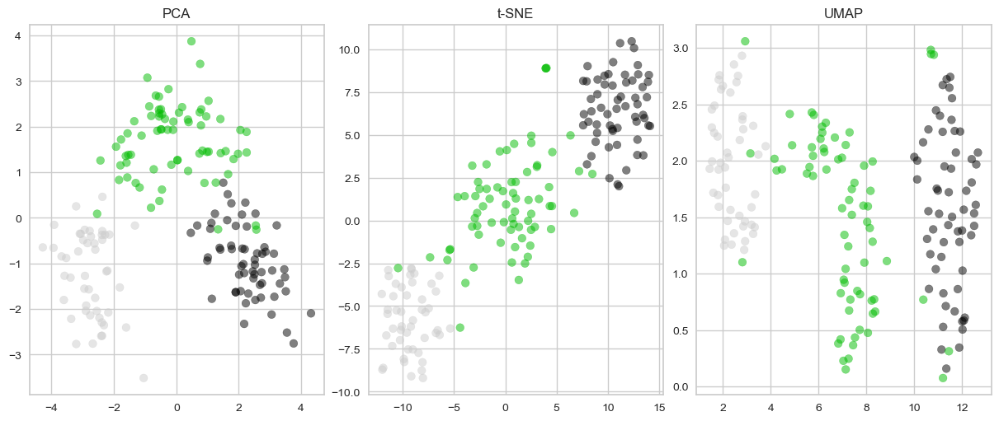

In [22]:
plt.rcParams['figure.figsize'] = [12, 5]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(wine.data)

reducers = [
    PCA(),
    TSNE(),
    UMAP()
]
reducers_names = ['PCA', 't-SNE', 'UMAP']

fig, axs = plt.subplots(1, 3, constrained_layout=True)

for i in range(3):
    embedding = reducers[i].fit_transform(scaled_data)
    x_vals = embedding[:, 0]
    y_vals = embedding[:, 1]
    axs[i].scatter(x_vals, y_vals, c=wine.target, cmap='nipy_spectral', alpha=0.5)
    axs[i].set_title(reducers_names[i])


## Clustering
There are a wide variety of different clustering algorithms. Here, we will only examine K-Means, perhaps the most commonly used clustering algorithm, and HDBSCAN, an improved version of the standard DBSCAN algorithm, which I think is one of the best :)
<br></br>
But here is a link to the sklearn implementation of different clustering algorithms with some helpful visualizations of the differences between each algorithm.
https://scikit-learn.org/stable/modules/clustering.html

In [21]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from hdbscan import HDBSCAN

### K-Means
By default, K-Means will attempt to make a guess as to how many clusters there are based on similarity in location. The number of clusters then, will vary. You can however manually set the number of clusters using the n_clusters parameter.

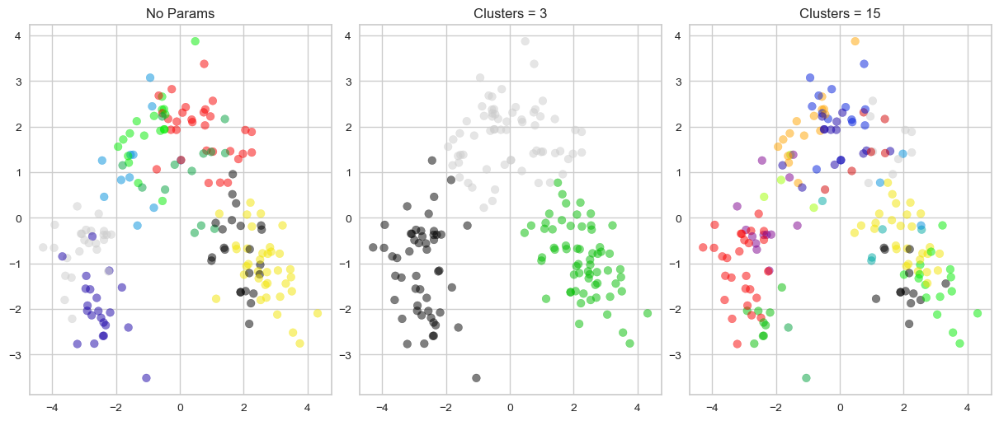

In [24]:
fig, axs = plt.subplots(1, 3, constrained_layout=True)
plt.rcParams['figure.figsize'] = [12, 5]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(wine.data)

reducer = PCA() # arbitrary for this demo
embedding = reducer.fit_transform(scaled_data)
x_vals = embedding[:, 0]
y_vals = embedding[:, 1]

param_names = ['No Params', 'Clusters = 3', 'Clusters = 15']
cluster_models = [
    KMeans(),
    KMeans(n_clusters=3),
    KMeans(n_clusters=15)
]

for i in range(3):
    labels = cluster_models[i].fit_predict(embedding)
    
    axs[i].scatter(x_vals, y_vals, c=labels, cmap='nipy_spectral', alpha=0.5)
    axs[i].set_title(param_names[i])

### Elbow Plots
How do we figure out whow many clusters to use for KMeans? One way to do this is to create an elbow plot. An elbow plot shows a metric called inertia for various different possible K values. A higher K means a lower inertia score the lower the inertia score the better, but there is a point of diminishing returns. Our aim is to find the number of clusters, K, that results in the best clusters/inertia ratio. You can find this by visualizing the plot as an arm and trying to find the spot that is the elbow.

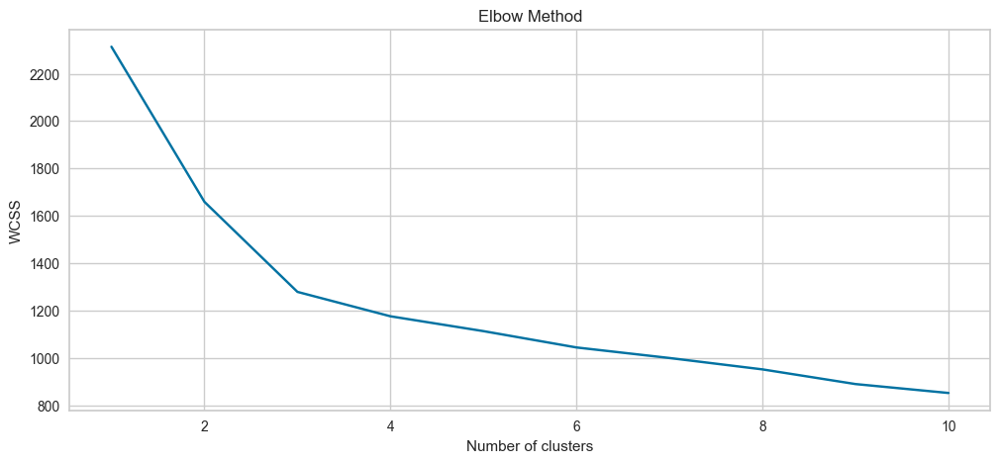

In [22]:
# elbow plot method 1
scaler = StandardScaler()
scaled_data = scaler.fit_transform(wine.data)

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

yellowbrick, another package, provides a very convenient visualizer function which automatically graphs an elbow plot and tells you what the best number of clusters is.

KElbowVisualizer(ax=<AxesSubplot: >, estimator=KMeans(n_clusters=10), k=(1, 11))

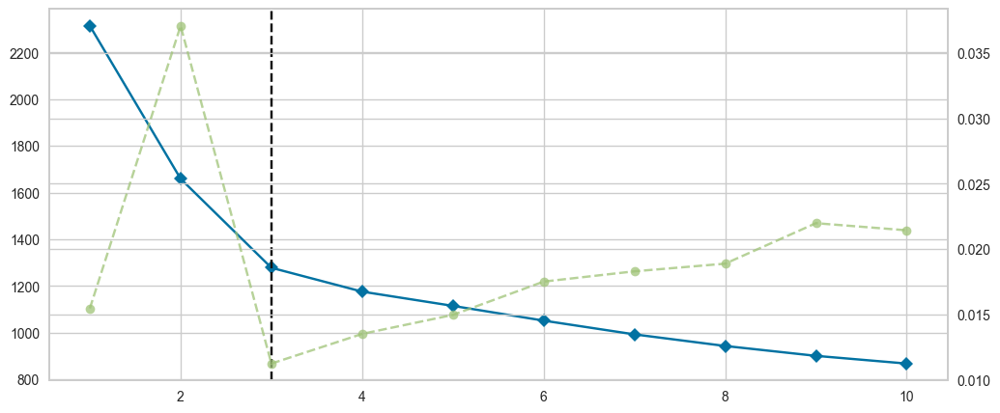

In [23]:
# elbow  plot method 2
visualizer = KElbowVisualizer(KMeans(), k=(1,11))
visualizer.fit(scaled_data)

### Hierarchical Density-Based Spatial Clustering of Applications with Noise
"HDBSCAN is a clustering algorithm developed by Campello, Moulavi, and Sander. It extends DBSCAN by converting it into a hierarchical clustering algorithm, and then using a technique to extract a flat clustering based in the stability of clusters."
https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html
<br></br>
Unlike K-Means clustering, HDBSCAN does not allow you to choose the default number of clusters, but if you do not know the exact amount of clusters, it generally performs better than other algorithms. In addition, unlike K-Means clustering, HDBSCAN does not need to assign every value to a label, and you can see the label -1 used when it is not confident about which cluster the data belongs to (this is shown as dark grey on the plot).
<br></br>
Due to the method in which the algorithm works, HDBSCAN is not a good choice for clustering based on PCA.

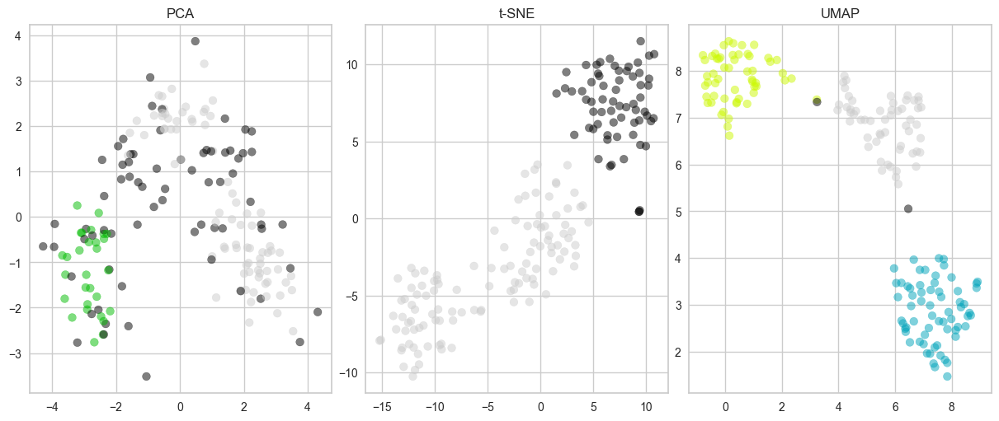

In [24]:
plt.rcParams['figure.figsize'] = [12, 5]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(wine.data)

cluster_model = HDBSCAN()

reducers = [
    PCA(),
    TSNE(),
    UMAP()
]
reducers_names = ['PCA', 't-SNE', 'UMAP']

fig, axs = plt.subplots(1, 3, constrained_layout=True)

for i in range(3):
    embedding = reducers[i].fit_transform(scaled_data)
    x_vals = embedding[:, 0]
    y_vals = embedding[:, 1]
    labels = cluster_model.fit_predict(embedding)
    axs[i].scatter(x_vals, y_vals, c=labels, cmap='nipy_spectral', alpha=0.5)
    axs[i].set_title(reducers_names[i])
    

# (5) Sidenote on Hyperparameters
Nearly every machine learning has a variety of different variables to finetune the performance. Certain algorithms are better than others using the default parameters, but to find the absolute best one, you have to play around. These variables are called hyperparameters and there is good documentation on the scikit-learn/UMAP/HDBSCAN websites. 
<br></br>
There are also a number of functions within sklearn to find the best parameter. This will not be covered in this course and you are not expected to use them, but if you are interested, here is a link to their documentation on finding the best model: https://scikit-learn.org/stable/model_selection.html#model-selection

# (6) Implementation With -Omics Data
Omics data works the exact same as the other data in this tutorial. Just remember to identify which machine learning technique to use, and to use every preprocessing step we talked about:
+ Clean NA values
+ Encode categorical variables into numeric labels
+ Scale data

# (7) Exercises - only this part will be graded
Exercises 1 & 2 will be graded on accuracy. Exercise 3 will be graded on completion and effort. No extra credit will be granted outside of Exercise 4.

**Exercise 1** - Preprocessing/Supervised Learning (3 pt)
1. Fill in the skeleton code to complete the iris classification plot.
2. Answer the following questions:
+ Define the following preprocessing methods and describe why each are necessary
    + NA removal
    + Scaling
    + Encoding
+ What is the difference between classification and regression?

In [54]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import datasets

iris = datasets.load_iris()
unscaled_data = iris.data

scaler = StandardScaler()

embedding_unscaled = UMAP().fit_transform(iris.data)

scaled_data = scaler.fit_transform(iris.data)
embedding_scaled = UMAP().fit_transform(scaled_data)

X_train, X_test, y_train, y_test = train_test_split(scaled_data, iris.target, train_size=0.75)
classifier = KNeighborsClassifier() # substitute with any classifier
classifier.fit(X_train, y_train) # trains model to training dataset, labels
y_pred = classifier.predict(X_test)


Visualize your predictions here

Text(0.5, 0.98, 'Comparing Length and Width Between Sepals and Petals')

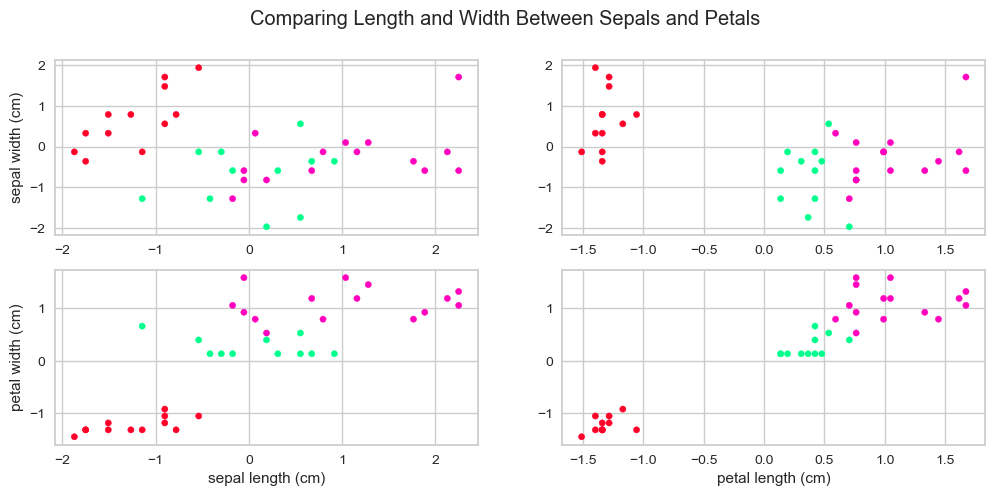

In [55]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 2)

iris_df = pd.DataFrame(X_test)

axs[0][0].scatter(iris_df.iloc[:, 0], iris_df.iloc[:, 1], c=y_pred, s=20, cmap='gist_rainbow')
axs[0][0].set_ylabel('sepal width (cm)')

axs[0][1].scatter(iris_df.iloc[:, 2], iris_df.iloc[:, 1], c=y_pred, s=20, cmap='gist_rainbow')

axs[1][0].scatter(iris_df.iloc[:, 0], iris_df.iloc[:, 3], c=y_pred, s=20, cmap='gist_rainbow')
axs[1][0].set_xlabel('sepal length (cm)')
axs[1][0].set_ylabel('petal width (cm)')

axs[1][1].scatter(iris_df.iloc[:, 2], iris_df.iloc[:, 3], c=y_pred, s=20, cmap='gist_rainbow')
axs[1][1].set_xlabel('petal length (cm)')

fig.suptitle('Comparing Length and Width Between Sepals and Petals')

In [ ]:
# answer questions here
# 1. NA removal is to remove all the NA value in the frame because many ML algorithms can't handle them and 
#will throw an error. 
#    Encoding means turning a categorical variable into a numeric veriable because doing classification needs numeric 
#data
#.   Scaling means reshaping the data so that we remove the mean and scale the data to unit variance. 
#The result is a range of values preserve the relations between the original data points but is centered at 0.
# 2. In classification, the goal is to predict a discrete class label for a given input data point. 
# In regression, the goal is to predict a continuous numerical value for a given input data point. 

**Exercise 2** - Unsupervised Learning (2 pt)
1. Fill in the skeleton code to complete the iris dimensionality reduction and clustering plot.
2. Answer the following questions:
+ What do the axes on a UMAP, t-SNE, or PCA plot represent?
+ Compare the clustered plot vs the actual labels, how close were the clustered labels?

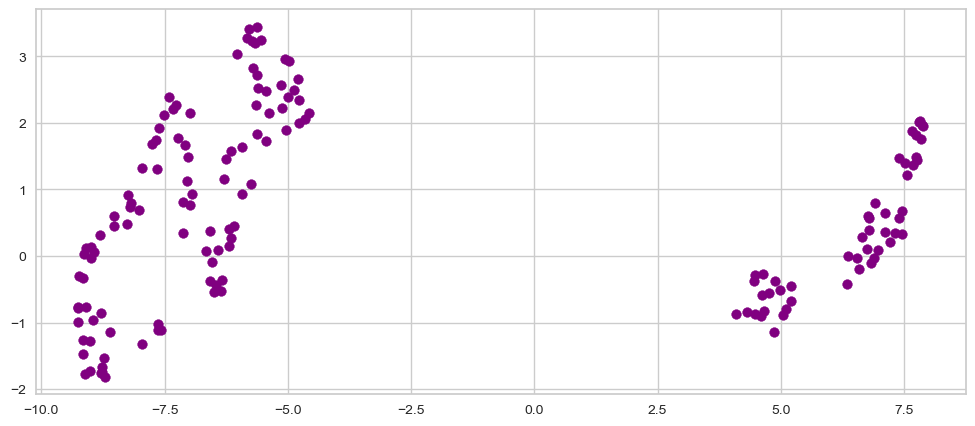

In [56]:
# Step 1) Dimensionality Reduction
from umap import UMAP

reducer = UMAP()

embedding = reducer.fit_transform(scaled_data) # use the scaled_data from exercise 1 for the data

plt.scatter(embedding[:, 0], embedding[:, 1], color='purple')

KElbowVisualizer(ax=<AxesSubplot: >, estimator=KMeans(n_clusters=10), k=(1, 11))

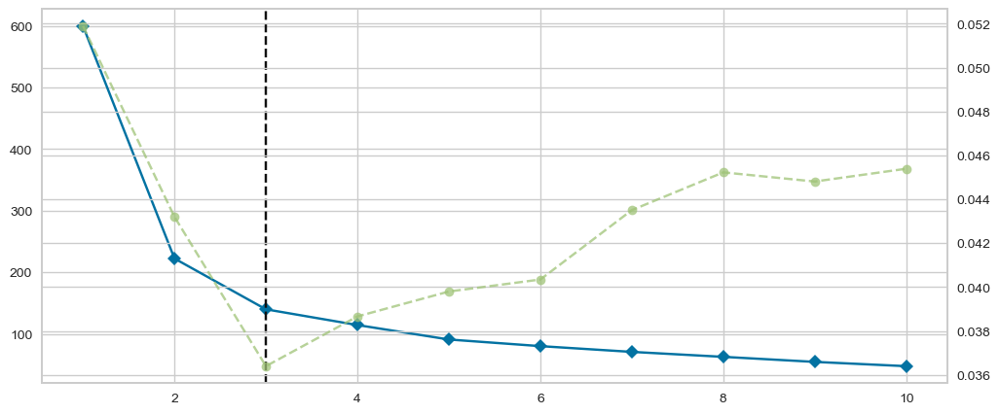

In [30]:
# Step 2) Determination of # of Clusters for KMeans()
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

visualizer = KElbowVisualizer(KMeans(), k=(1,11))
visualizer.fit(scaled_data)

Text(0.5, 1.0, 'Actual Labels')

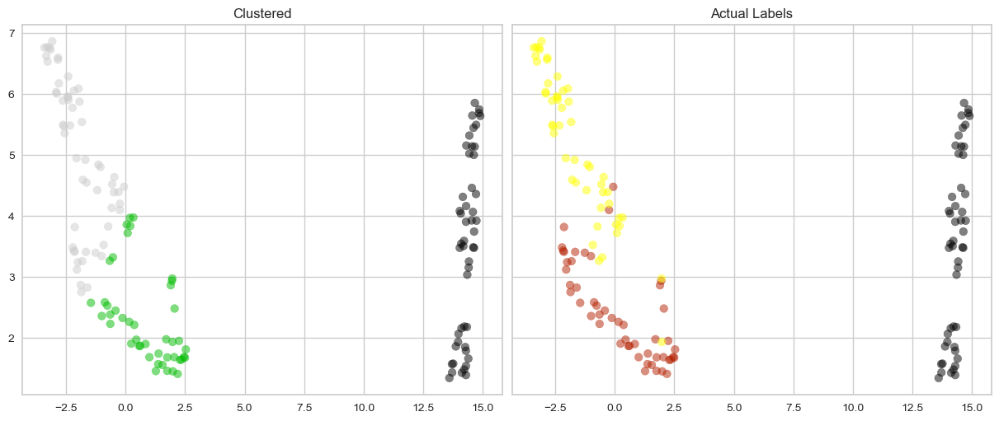

In [31]:
# Step 3) KMeans Clustering
cluster_model = KMeans(n_clusters =3)

labels = cluster_model.fit_predict(embedding)

fig, axs = plt.subplots(1, 2, constrained_layout=True, sharey=True)

axs[0].scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='nipy_spectral', alpha=0.5)
axs[0].set_title('Clustered')
axs[1].scatter(embedding[:, 0], embedding[:, 1], c=iris.target, cmap='gnuplot', alpha=0.5)
axs[1].set_title('Actual Labels')

In [ ]:
# answer questions here
# 1. The axes in a UMAP, t-SNE, or PCA plot represent the new low-dimensional features that 
# have been extracted from the high-dimensional input data. 
# 2. The clustered labels are very similar to the actual labels, and only a small portion have differences. 

**Exercise 3** - Do It Yourself (5 pt)
<br></br>dermatology.csv is a CSV file with 34 different features. The exact description of each feature is in the dermatology.txt file. Each patient has one of the following conditions (this is the 35th column):
+ psoriasis (1)
+ seboreic dermatitis (2)
+ lichen planus (3)
+ pityriasis rosea (4)
+ chronic dermatitis (5)
+ pityriasis rubra pilaris (6)

Part I - Preprocessing (1 pt)
1. Load the data in
2. Separate the target column
3. Preprocess the data using necessary methods

In [90]:
# write code here
import pandas as pd

dermatology = pd.read_csv(r'/Users/kojiro/desktop/qbio490/sp23_course_material/week11_python_applications/dermatology.csv')
data_mask = np.where(dermatology.iloc[:,33] == '?',False, True)
dermatology = dermatology.loc[data_mask,:]
conditions = dermatology.iloc[:,34]
scaler = StandardScaler()
scaled_dermatology = scaler.fit_transform(dermatology)
print(conditions)

0      1
1      3
2      1
3      3
4      2
      ..
360    4
361    4
362    3
363    3
364    1
Name: 2.3, Length: 357, dtype: int64


Part II - Supervised Learning (2 pt)
1. Create a train-test split with an appropriate split-ratio
2. Test at least 3 different classification techniques to determine which is best able to predict skin condition and present it in a graphical method (can be separate or joined figures)
3. Use the age column as a target and create a regression model to predict age from the other features (include skin condition as a feature)

(267, 35)
(90, 35)
(267,)
(90,)
[5 4 1 4 6 2 5 1 1 1 2 3 1 5 1 1 3 3 2 3 1 3 1 5 2 3 2 2 2 2 5 4 2 3 2 1 2
 5 1 4 1 4 6 1 3 1 6 1 1 1 5 5 5 6 2 1 1 1 1 2 3 4 5 5 3 5 1 5 1 1 1 3 4 1
 6 1 1 2 1 1 5 2 1 1 3 1 4 3 2 4]
298    5
160    2
109    1
284    2
70     6
      ..
241    1
259    4
64     3
95     2
73     4
Name: 2.3, Length: 90, dtype: int64
[5 2 1 2 6 2 5 1 1 1 2 3 1 5 1 1 3 3 2 3 1 3 1 5 2 3 2 2 3 1 5 4 2 3 2 1 2
 5 1 4 1 4 6 1 3 1 6 1 1 1 5 5 5 6 2 1 1 1 1 2 3 4 5 5 3 5 1 5 1 1 1 3 2 1
 6 1 1 2 1 1 5 2 1 1 3 1 4 3 2 4]
298    5
160    2
109    1
284    2
70     6
      ..
241    1
259    4
64     3
95     2
73     4
Name: 2.3, Length: 90, dtype: int64
[5 2 1 2 6 2 5 1 1 1 2 3 1 5 1 1 3 3 2 3 1 3 1 5 2 3 2 2 2 1 5 4 2 3 2 1 2
 5 1 4 1 4 6 1 3 1 6 1 1 1 5 5 5 6 2 1 1 1 1 2 3 4 5 5 3 5 1 5 1 1 1 3 2 1
 6 1 1 2 1 1 5 2 1 1 3 1 4 3 2 4]
298    5
160    2
109    1
284    2
70     6
      ..
241    1
259    4
64     3
95     2
73     4
Name: 2.3, Length: 90, dtype: int64
[5 2 1 2 6 

Text(0.5, 0, 'Classification method')

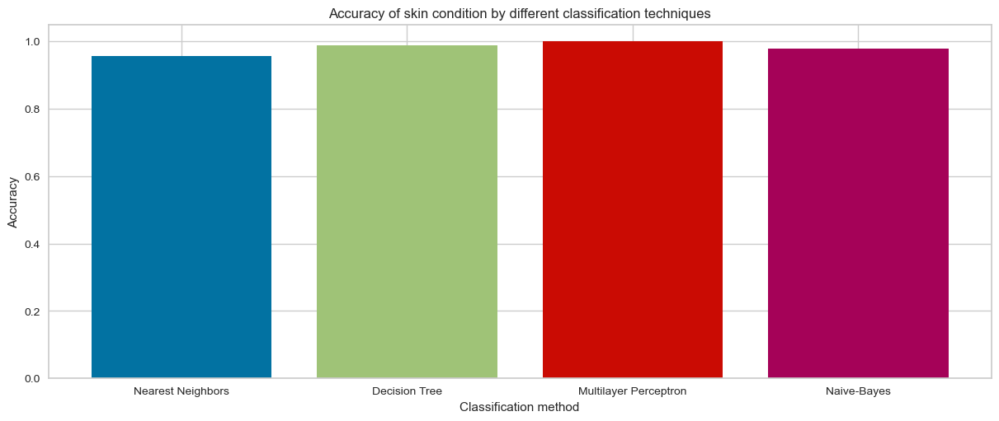

In [134]:
# 1&2
X_train, X_test, y_train, y_test = train_test_split(scaled_dermatology,conditions, train_size=0.75)
print(X_train.shape) # dataset split by train size
print(X_test.shape) # dataset not included in above dataset
print(y_train.shape) # labels for corresponding X_train
print(y_test.shape)
scaler = StandardScaler()
classifiers = [
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    MLPClassifier(),
    GaussianNB()
]

classifiers_names = ['Nearest Neighbors', 'Decision Tree', 'Multilayer Perceptron', 'Naive-Bayes']
fig, axs = plt.subplots(1, 1, constrained_layout=True, sharey=True)

for i in range(len(classifiers)):
    model = classifiers[i]
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    fraction_correct = sum(y_pred==y_test)/len(y_test)
    axs.bar(classifiers_names[i],fraction_correct)
axs.set_title("Accuracy of skin condition by different classification techniques")
axs.set_ylabel("Accuracy")
axs.set_xlabel("Classification method")


In [146]:
#3
age = dermatology.iloc[:,33]
regressors_names = [
    'Linear', 
    'Nearest Neighbors', 
    'Stochastic Gradient Descent', 
    'Support Vector',
    'Bayesian Ridge'
]

regressors = [
    LinearRegression(),
    KNeighborsRegressor(),
    SGDRegressor(),
    SVR(),
    BayesianRidge()
]

regressors_perf = {
    0: [],
    1: [],
    2: [],
    3: [],
    4: []
}

for n in range(1000):
    X_train, X_test, y_train, y_test = train_test_split(scaled_dermatology, age, train_size=0.75)
    for i in range(len(regressors)):
        model = regressors[i]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        difference = y_pred - y_test #I tried to change the type of y_test from str to float, but I failed. I think it would be fine if I solve this problem
        regressors_perf[i].append(abs(np.mean(difference)))
        
print('\nAfter 1000 simulations, the average error for each regressor is as follows:')
for i in regressors_perf:
    print(f'\t{regressors_names[i]} : {np.mean(regressors_perf[i])}')


    

TypeError: cannot convert the series to <class 'int'>

Part III - Unsupervised Learning (2 pt)
1. Use all three dimensionality-reduction techniques to show the data from Part I in 2D (can be separate or joined figures) Pick the dimensionality-reduction technique which results in the greatest separation
2. Create an elbow plot to determine the K number of clusters for K-Means
3. Cluster based on K-Means and HDBSCAN in a figure which shows both methods side by side

KElbowVisualizer(ax=<AxesSubplot: >, estimator=KMeans(n_clusters=10), k=(1, 11))

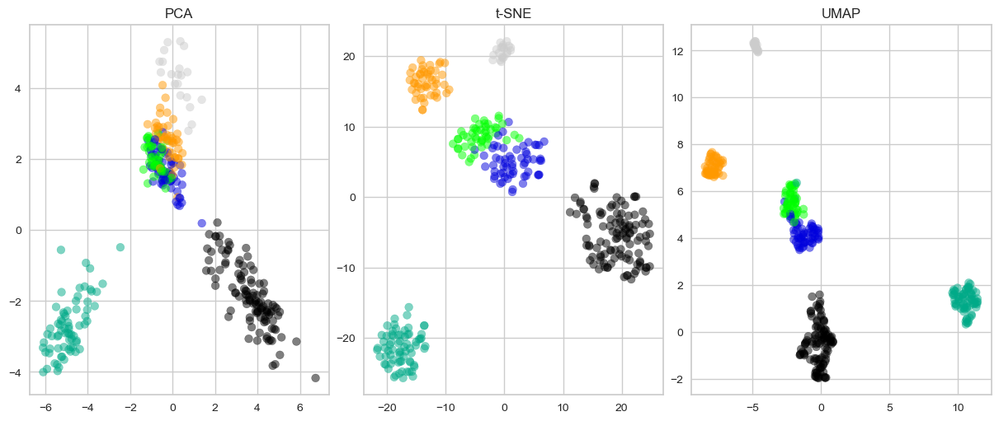

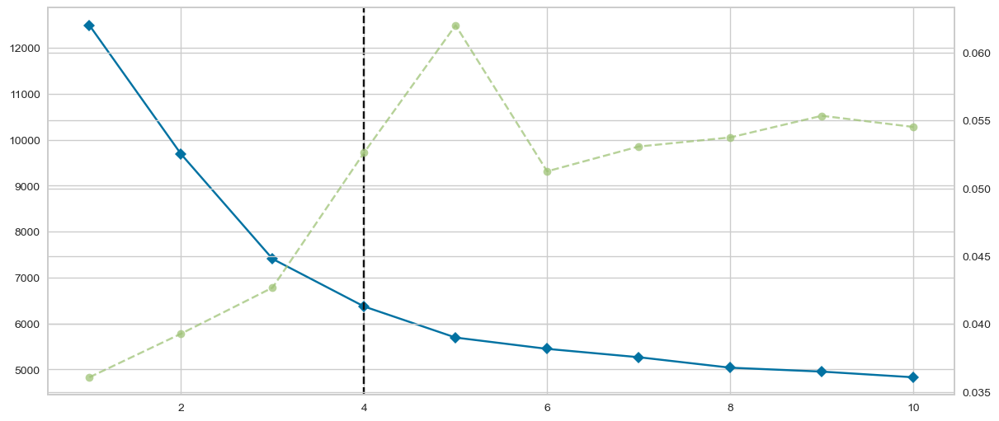

In [107]:
# 1
reducers = [
    PCA(),
    TSNE(),
    UMAP()
]
reducers_names = ['PCA', 't-SNE', 'UMAP']

fig, axs = plt.subplots(1, 3, constrained_layout=True)

for i in range(3):
    embedding = reducers[i].fit_transform(scaled_dermatology)
    x_vals = embedding[:, 0]
    y_vals = embedding[:, 1]
    axs[i].scatter(x_vals, y_vals, c=conditions, cmap='nipy_spectral', alpha=0.5)
    axs[i].set_title(reducers_names[i])
    
# 2
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
fig, axs = plt.subplots(1, 1, constrained_layout=True)
visualizer = KElbowVisualizer(KMeans(), k=(1,11))
visualizer.fit(scaled_dermatology)


Text(0.5, 1.0, 'HDBSCAN')

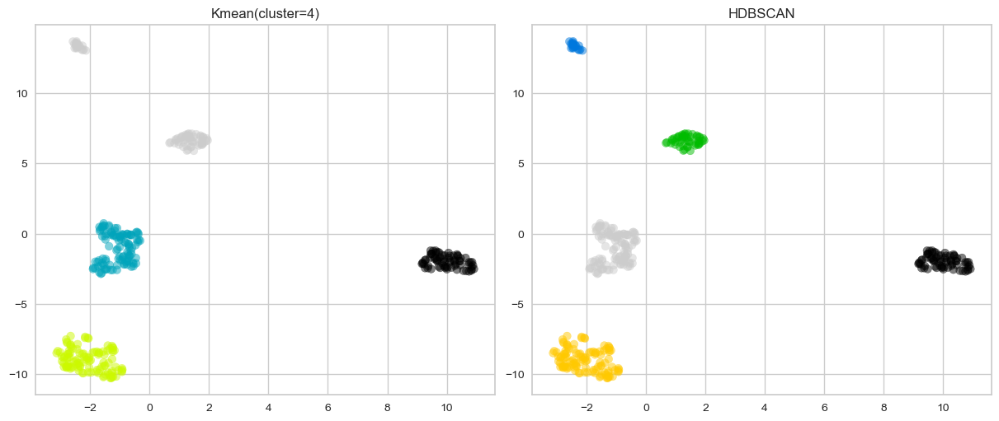

In [114]:
#3
fig, axs = plt.subplots(1, 2, constrained_layout=True)
reducer = UMAP() 
embedding = reducer.fit_transform(scaled_dermatology)
x_vals = embedding[:, 0]
y_vals = embedding[:, 1]

cluster_model_1 = KMeans(n_clusters=4)

labels = cluster_model_1.fit_predict(embedding)
    
axs[0].scatter(x_vals, y_vals, c=labels, cmap='nipy_spectral', alpha=0.5)
axs[0].set_title("Kmean(cluster=4)")

cluster_model_2 = HDBSCAN()
reducers = UMAP()
labels = cluster_model_2.fit_predict(embedding)
axs[1].scatter(x_vals, y_vals, c=labels, cmap='nipy_spectral', alpha=0.5)
axs[1].set_title("HDBSCAN")

Part IV - Brief Response (REQUIRED IN ORDER TO GET CREDIT FOR EACH OTHER PART)
<br></br>
Answer the following questions if you completed the part:
1. Which of the preprocessing techniques were required for the data? How did you know?
2. Which supervised learning technique (classification vs regression) was best able to predict its respective target? Why do you think so?
3. Interpret what the distance between each point represents on the reduced dimensions figure.

In [ ]:
# answer questions here
# 1. Removing NA and scaling should be done for this data. I know there's NA values in age column from 
# the txt file describing the csv data sheet. 
# 2. The classification technique is best to predict categorical variables, and the regression technique is best to 
# predict continuous variable. Thus, the skin condition is predicted by classification and age is predicted by regression.
# 3. The distance between two points in the reduced-dimensional space represents the dissimilarity or distance 
# between the corresponding high-dimensional data points.


**Exercise 4** - Challenge - Extra Credit (5 pts possible) <br>
</br>
INDIVIDUAL WORK ONLY - credit will be awarded based on thoughtful completion and demonstration of an understanding of ML principles, <u>code comments must be included</u>
<br></br>mushroom.csv is a dataset includes 61069 hypothetical mushrooms with caps based on 173 species (353 mushrooms per species). Each mushroom is identified as edible or poisonous. Of the 20 variables, 17 are nominal and 3 are metrical. The features and dataset design can be found in mushroom.txt. Your task is as follows:
+ Load and process the data (one challenge we often find ourselves facing is having to reformat data, this will be an exercise in that) from the .csv file
+ Create a classifier design and test that it can correctly identify whether a mushroom is edible or poisonous with a minimum accuracy of no lower than 95%. You will determine this by testing it on a 60/40 train-test split 20 times.

In [ ]:
# write code here